<a href="https://colab.research.google.com/github/guthi1/statistics-dump/blob/main/wine/wine_testing_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Wine quality analysis

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go
from plotly.offline import iplot
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

BASE_PATH = "/content/"

In [2]:
full_dataset = pd.read_csv(f"{BASE_PATH}wine_data.csv")

In [3]:
full_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    6497 non-null   int64  
 1   groupe                6497 non-null   object 
 2   Y_qualite             6497 non-null   int64  
 3    Z_qualite            6497 non-null   object 
 4    couleur              6497 non-null   object 
 5   fixed_acidity         6497 non-null   float64
 6   volatile_acidity      6497 non-null   float64
 7   citric_acid           6497 non-null   float64
 8   residual_sugar        6497 non-null   float64
 9   chlorides             6497 non-null   float64
 10  free_sulfur_dioxide   6497 non-null   float64
 11  total_sulfur_dioxide  6497 non-null   int64  
 12  density               6497 non-null   float64
 13  pH                    6497 non-null   float64
 14  sulphates             6497 non-null   float64
 15  alcohol              

In [4]:
full_dataset.head(5)

,ID,groupe,Y_qualite,Z_qualite,couleur,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,1,train,5,OK,rouge,7.4,0.70,0.00,1.9,0.076,11.0,34,0.9978,3.51,0.56,9.4
1,2,validate,5,OK,rouge,7.8,0.88,0.00,2.6,0.098,25.0,67,0.9968,3.20,0.68,9.8
2,3,validate,5,OK,rouge,7.8,0.76,0.04,2.3,0.092,15.0,54,0.9970,3.26,0.65,9.8
3,4,train,6,OK,rouge,11.2,0.28,0.56,1.9,0.075,17.0,60,0.9980,3.16,0.58,9.8
4,5,train,5,OK,rouge,7.4,0.70,0.00,1.9,0.076,11.0,34,0.9978,3.51,0.56,9.4


In [5]:
feature_colum_names = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol']
y_column_name = 'Y_qualite'

## a) Compare, using cross-tabulations and appropriate statistical tests, the 3 subsets to decide if they are relatively similar (homogeneous) for the response variable Y (QUALITY).

### Split the data into training, valid and test set to check if the distribution are the same

In [6]:
# Split the data
train = full_dataset[full_dataset['groupe'] == 'train']
print(f'Amount of data point in train: {train.shape}')

valid = full_dataset[full_dataset['groupe'] == 'validate']
print(f'Amount of data point in valid: {valid.shape}')

test  = full_dataset[full_dataset['groupe'] == 'test']
print(f'Amount of data point in test : {test.shape}')


Amount of data point in train: (3916, 16)
Amount of data point in valid: (1317, 16)
Amount of data point in test : (1264, 16)


### Check the composition of the differet split

In [7]:
train_without_id = train[feature_colum_names + ['Y_qualite']]
valid_without_id = valid[feature_colum_names + ['Y_qualite']]
test_without_id  = test[feature_colum_names + ['Y_qualite']]

In [8]:
from google.colab import data_table
print("Train")
display(data_table.DataTable(train_without_id.describe().round(3), include_index=True, min_width="300"))
print("\nValid")
display(data_table.DataTable(valid_without_id.describe().round(3), include_index=True, min_width="300"))
print("\nTest")
display(data_table.DataTable(test_without_id.describe().round(3), include_index=True, min_width="300"))

Train


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,Y_qualite
count,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000,3916.000
mean,7.224,0.340,0.319,5.481,0.056,30.566,115.653,0.995,3.218,0.534,10.505,5.836
std,1.318,0.163,0.146,4.750,0.035,17.428,56.411,0.003,0.162,0.148,1.204,0.871
min,3.900,0.080,0.000,0.600,0.009,1.000,7.000,0.987,2.720,0.230,8.000,3.000
25%,6.400,0.230,0.248,1.800,0.038,17.000,78.000,0.992,3.110,0.430,9.500,5.000
50%,7.000,0.295,0.310,3.000,0.047,29.000,118.000,0.995,3.200,0.510,10.300,6.000
75%,7.700,0.400,0.390,8.100,0.065,41.000,155.000,0.997,3.320,0.600,11.300,6.000
max,15.900,1.330,1.660,31.600,0.611,131.000,367.000,1.010,4.010,1.950,14.900,9.000



Valid


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,Y_qualite
count,1317.000,1317.000,1317.000,1317.000,1317.000,1317.00,1317.000,1317.000,1317.000,1317.000,1317.000,1317.000
mean,7.164,0.336,0.317,5.446,0.056,30.55,116.341,0.995,3.221,0.527,10.505,5.828
std,1.241,0.163,0.142,4.880,0.036,17.76,55.246,0.003,0.161,0.149,1.189,0.884
min,4.400,0.090,0.000,0.600,0.012,1.00,6.000,0.987,2.740,0.220,8.600,3.000
25%,6.400,0.220,0.250,1.800,0.038,17.00,80.000,0.992,3.110,0.430,9.500,5.000
50%,7.000,0.290,0.310,3.100,0.048,29.00,119.000,0.995,3.210,0.500,10.300,6.000
75%,7.600,0.400,0.390,8.100,0.062,42.00,154.000,0.997,3.320,0.600,11.300,6.000
max,13.800,1.580,0.790,65.800,0.464,146.50,308.000,1.039,3.900,1.950,14.200,8.000



Test


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,Y_qualite
count,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000,1264.000
mean,7.243,0.345,0.319,5.324,0.057,30.375,115.419,0.995,3.217,0.528,10.438,5.756
std,1.284,0.173,0.148,4.654,0.035,18.713,58.213,0.003,0.156,0.150,1.161,0.867
min,3.800,0.080,0.000,0.700,0.014,1.000,6.000,0.988,2.740,0.260,8.400,3.000
25%,6.400,0.230,0.250,1.800,0.039,16.000,75.000,0.992,3.110,0.430,9.500,5.000
50%,7.000,0.290,0.310,2.850,0.048,28.000,120.000,0.995,3.210,0.510,10.200,6.000
75%,7.725,0.410,0.390,8.100,0.066,42.000,158.000,0.997,3.320,0.600,11.200,6.000
max,15.500,1.240,1.000,26.050,0.610,289.000,440.000,1.003,4.010,2.000,14.000,9.000


Étant donné que nous allons utiliser ces ensembles de données pour créer un modèle de prédiction de qualité de vin, il est important de s'assurer que les ensembles sont relativement similaires. En effet, des différences significatives entre les ensembles peuvent potentiellement affecter les performances du modèle et entraîner des prévisions biaisées.


La première observation à effectuer est la quantité de données dans chaque ensemble de données. Le jeu de données propose une distribution de 60% (3916 données) pour l'ensemble d'entraînement du modèle, 21% (1317 données) pour l'ensemble de validation et 19% (1264 données) pour l'ensemble de test. Ces proportions vont permettre d'évaluer la qualité du modèle créé avec de nouvelles données non observées dans le passé.


Maintenant que les proportions d'allocation des ensembles ont été vérifiées, le prochain point important est d'examiner la distribution des différentes variables physico-chimiques. Celles-ci sont très similaires pour les variables qui seront utilisées pour effectuer la prédiction. On observe des moyennes extrêmement similaires, avec la plus grande différence étant de 2% pour l'indicateur de chlorures, et ces variables ont une déviation standard quasi identique. Une différence observée entre les ensembles concerne les extrêmes : l'ensemble de validation et de test comportent des données ayant des valeurs d'extrêmes plus élevées que les données de l'ensemble d'entraînement. Il sera intéressant d'évaluer les résultats de ces ensembles plus tard et de voir comment le modèle se comporte dans ce cas.

---

Since we are going to use these data sets to create a wine quality prediction model, it is important to ensure that the sets are relatively similar. Indeed, significant differences between the sets could potentially affect the performance of the model and lead to biased forecasts.

The first observation to be made is the amount of data in each data set. The data set proposes a distribution of 60% (3916 data) for the training set of the model, 21% (1317 data) for the validation set, and 19% (1264 data) for the test set. These proportions will allow us to evaluate the quality of the model created with new data that has not been observed in the past.

Now that the allocation proportions of the sets have been verified, the next important point is to examine the distribution of the various physicochemical variables. These are very similar for the variables that will be used to perform the prediction. We observe extremely similar means, with the largest difference being 2% for the indicator of chlorides, and these variables have a quasi-identical standard deviation. One difference observed between the sets concerns the extremes: the validation and test sets contain data with higher extreme values than the training set data. It will be interesting to evaluate the results of these sets later and see how the model behaves in this case.


In [9]:
print("Train")
pivot_train = train.pivot_table(feature_colum_names,['Y_qualite'], aggfunc='median')
display(data_table.DataTable(pivot_train.round(3), include_index=True, min_width="300"))

print("\nValid")
pivot_valid = valid.pivot_table(feature_colum_names,['Y_qualite'], aggfunc='median')
display(data_table.DataTable(pivot_valid.round(3), include_index=True, min_width="300"))

print("\nTest")
pivot_test = test.pivot_table(feature_colum_names,['Y_qualite'], aggfunc='median')
display(data_table.DataTable(pivot_test.round(3), include_index=True, min_width="300"))


Train


,alcohol,chlorides,citric_acid,density,fixed_acidity,free_sulfur_dioxide,pH,residual_sugar,sulphates,total_sulfur_dioxide,volatile_acidity
Y_qualite,,,,,,,,,,,
3,9.95,0.053,0.34,0.996,7.5,16.0,3.240,4.60,0.510,123,0.39
4,10.20,0.051,0.25,0.995,6.9,15.0,3.230,2.30,0.490,102,0.39
5,9.60,0.053,0.30,0.996,7.1,28.0,3.190,3.30,0.500,126,0.33
6,10.50,0.046,0.31,0.995,6.9,29.0,3.210,3.30,0.510,117,0.27
7,11.40,0.039,0.32,0.992,6.9,30.0,3.220,2.65,0.520,113,0.27
8,12.05,0.036,0.32,0.992,6.7,34.5,3.230,4.20,0.485,120,0.26
9,12.60,0.026,0.35,0.990,7.0,29.0,3.325,2.10,0.450,116,0.31



Valid


,alcohol,chlorides,citric_acid,density,fixed_acidity,free_sulfur_dioxide,pH,residual_sugar,sulphates,total_sulfur_dioxide,volatile_acidity
Y_qualite,,,,,,,,,,,
3,10.9,0.074,0.22,0.995,7.60,24.0,3.25,2.10,0.430,111.0,0.49
4,10.0,0.050,0.26,0.995,7.15,13.5,3.21,2.15,0.495,105.0,0.35
5,9.6,0.052,0.30,0.996,7.10,28.0,3.20,3.30,0.500,131.0,0.33
6,10.5,0.047,0.30,0.994,6.90,29.0,3.21,3.30,0.500,118.0,0.27
7,11.4,0.039,0.32,0.992,6.80,29.0,3.25,2.75,0.510,112.5,0.28
8,12.2,0.039,0.31,0.992,7.00,32.0,3.19,4.30,0.480,114.0,0.30



Test


,alcohol,chlorides,citric_acid,density,fixed_acidity,free_sulfur_dioxide,pH,residual_sugar,sulphates,total_sulfur_dioxide,volatile_acidity
Y_qualite,,,,,,,,,,,
3,10.6,0.054,0.335,0.995,7.35,11.5,3.375,2.5,0.545,72.5,0.470
4,10.0,0.050,0.300,0.995,7.00,17.0,3.170,2.1,0.470,97.0,0.380
5,9.6,0.053,0.300,0.996,7.10,25.0,3.200,2.7,0.500,123.0,0.330
6,10.4,0.047,0.310,0.995,6.90,30.5,3.210,2.8,0.520,118.5,0.270
7,11.5,0.039,0.320,0.993,6.90,31.0,3.210,3.8,0.520,122.0,0.270
8,11.6,0.037,0.335,0.992,6.85,32.5,3.260,2.9,0.460,117.5,0.275
9,10.4,0.035,0.450,0.997,9.10,28.0,3.200,10.6,0.460,124.0,0.270


la prochaine étape de l'analyse consiste à examiner la distribution de nos données en fonction de la variable à prédire. Nous remarquons tout d'abord que bien que la valeur de qualité se situe dans une plage allant de 1 à 10, les juges n'attribuent des notes qu'entre 3 et 9.

Pour cette analyse, nous avons choisi d'utiliser la médiane plutôt que la moyenne afin de mieux comprendre la distribution des données. La médiane représente la valeur centrale d'un ensemble de données et n'est pas affectée par les valeurs aberrantes ou extrêmes, ce qui en fait une mesure plus robuste de la tendance centrale des données, notamment dans les cas où nous avons moins de données, comme dans le cas des qualités de vin.

Les résultats obtenus nous donnent une meilleure idée des différences entre nos ensembles de données. Les distributions pour les vins de "bonne" qualité sont très similaires, mais des problèmes surviennent avec les distributions pour les ensembles plus extrêmes, c'est-à-dire les vins de très mauvaise qualité et les vins d'excellente qualité. Nous observons dans ces distributions des valeurs centrales pouvant être jusqu'à cinq fois plus grande (ex: qualité 9 : indicateur residual_sugar).

Cependant, il est logique que la distribution des vins ayant une qualité de 9 soit plus petite et que ces vins ne soient pas similaire entre eux, car un vin exceptionnel se distingue par le fait qu'il ne ressemble à aucun autre.

---

The next step in the analysis is to examine the distribution of our data with respect to the target variable. We first notice that although the quality value ranges from 1 to 10, judges only give scores between 3 and 9.

For this analysis, we chose to use the median instead of the mean to better understand the distribution of the data. The median represents the central value of a data set and is not affected by outliers or extreme values, making it a more robust measure of central tendency, especially in cases where we have less data, such as in the case of wine quality.

The results obtained give us a better idea of the differences between our data sets. The distributions for "good" quality wines are very similar, but problems arise with the distributions for the more extreme sets, such as very poor quality wines and excellent quality wines. We observe in these distributions central values that can be up to five times larger (e.g., quality 9: residual_sugar indicator).

However, it makes sense that the distribution of wines with a quality of 9 is smaller and that these wines are not similar to each other, as an exceptional wine stands out by not resembling any other.

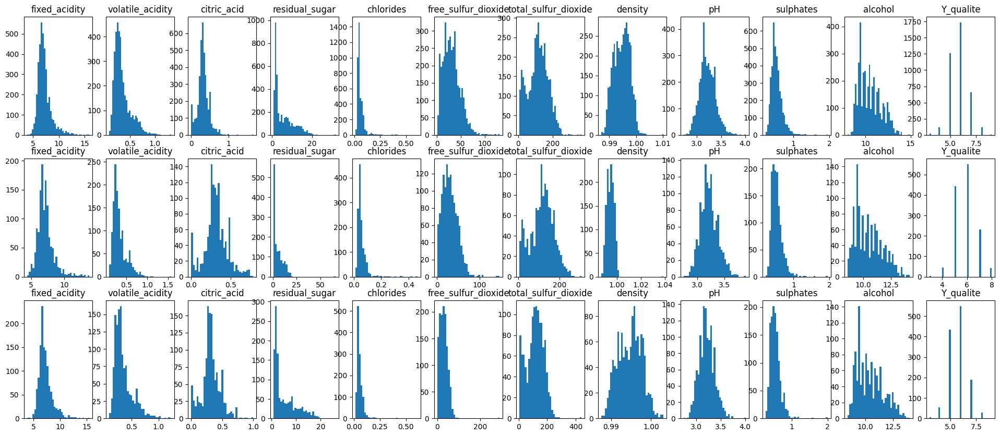

In [10]:
fig, axs = plt.subplots(3, train_without_id.shape[1], figsize=(24, 10))

for i, df in enumerate([train_without_id, valid_without_id, test_without_id]):
    for j in range(df.shape[1]):
        axs[i, j].hist(df.iloc[:, j], bins=int(5*np.log(len(df))))
        axs[i, j].set_title(df.columns[j])

plt.show()

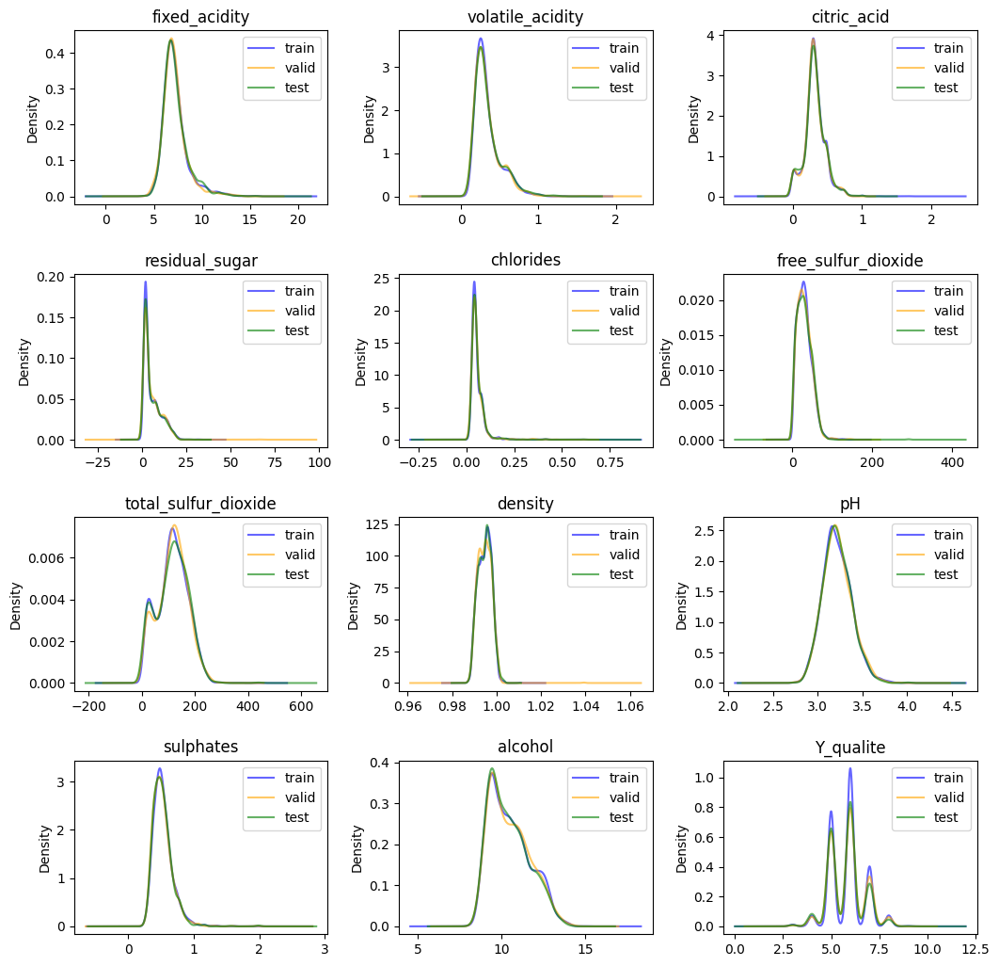

In [11]:
fig, axs = plt.subplots(len(train_without_id.columns)//3, 3, figsize=(12, 12))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.28, hspace=0.4)

colors = ['blue', 'orange', 'green']
labels = ['train', 'valid', 'test']
dfs = [train_without_id, valid_without_id, test_without_id]

for i, col_name in enumerate(train_without_id.columns):
    row_idx, col_idx = i//3, i%3
    axs[row_idx, col_idx].set_title(col_name)
    for j, df in enumerate(dfs):
        df[col_name].plot(kind='density', color=colors[j], ax=axs[row_idx, col_idx], alpha=0.6, label=labels[j])
    axs[row_idx, col_idx].legend()
    
plt.show()

La prochaine étape consiste à examiner la similarité des distributions de variables entre les trois ensembles de données pour s'assurer qu'elles sont similaires. Il est observé que c'est effectivement le cas pour toutes les variables physico-chimiques. Certaines d'entre elles semblent suivre un mélange de lois normales (avec des pics multiples), ce qui pourrait être dû au fait qu'il y a deux types de vin (rouge et blanc) ou deux sous-groupes qui expliquent la variable dépendante, entre autres raisons. Ce point devra être déterminé.

La variable avec une différence significative dans la distribution est la qualité (variable dépendante). On observe que l'ensemble d'entraînement a une densité plus élevée, mais les différents pics sont plus ou moins représentés de manière proportionnelle dans les trois ensembles, ce qui indique qu'il n'y a pas de problème. (Conclusion vérifier avec les 3 prochains graphiques)

---

The next step is to examine the similarity of the variable distributions across the three datasets to ensure that they appear similar. It is observed that this is indeed the case for all of the physicochemical variables. Some of them appear to follow a mixture of normal distributions (with multiple peaks), which could be due to the fact that there are two types of wine (red and white) or two subgroups that explain the dependent variable, among other reasons. This point will need to be determined.

The variable with a significant difference in distribution is the quality (dependent variable). It is observed that the training set has a higher density, but the different peaks are more or less proportionally represented across the three sets, indicating no problem. (Conclusion verified with the next 3 graphs)

<ipython-input-12-9418da535987>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




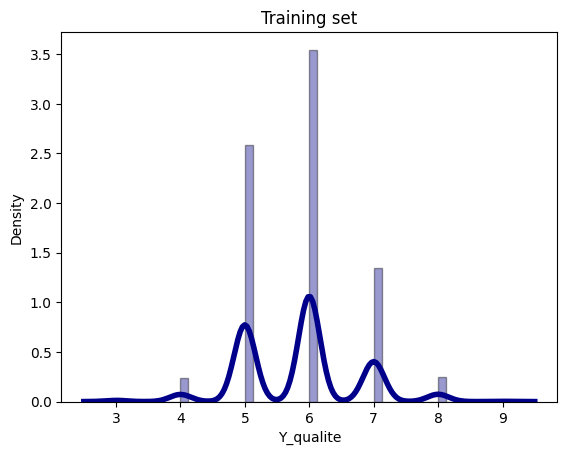

In [12]:
sns.distplot(train_without_id['Y_qualite'], hist=True, kde=True,
             bins='auto', color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
plt.title("Training set")
plt.show()

<ipython-input-13-3092d8be1d52>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




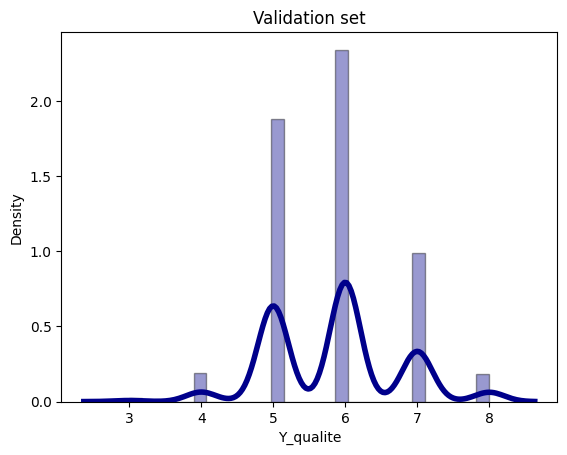

In [ ]:
sns.distplot(valid_without_id['Y_qualite'], hist=True, kde=True,
             bins='auto', color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
plt.title("Validation set")
plt.show()

<ipython-input-14-b95840cb67e4>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




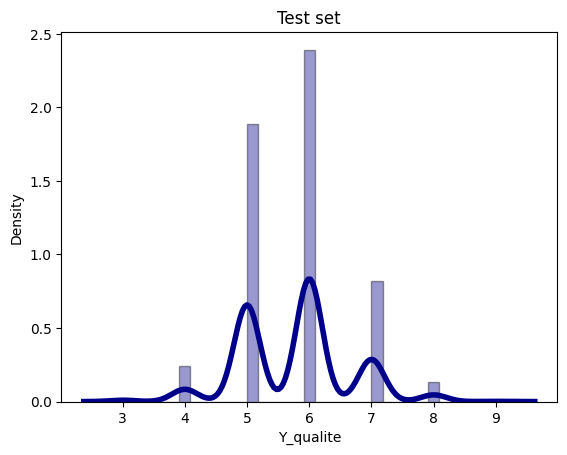

In [ ]:
sns.distplot(test_without_id['Y_qualite'], hist=True, kde=True,
             bins='auto', color = 'darkblue',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
plt.title("Test set")
plt.show()

### Evaluation of the correlation of variables 

In [ ]:
corr_matrix = train.corr()
corr_matrix["Y_qualite"].sort_values(ascending=False)

Y_qualite               1.000000
alcohol                 0.448594
ID                      0.117979
citric_acid             0.082832
free_sulfur_dioxide     0.055582
sulphates               0.029403
pH                      0.026217
total_sulfur_dioxide   -0.044794
residual_sugar         -0.051684
fixed_acidity          -0.078755
chlorides              -0.203099
volatile_acidity       -0.264731
density                -0.322994
Name: Y_qualite, dtype: float64

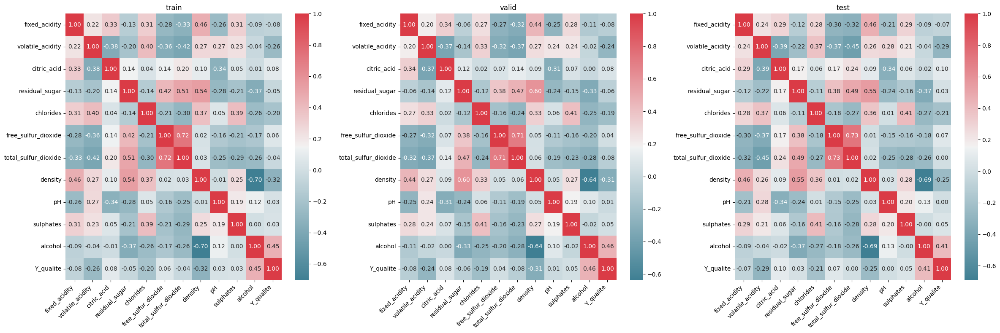

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

dfs = [train_without_id, valid_without_id, test_without_id]
labels = ['train', 'valid', 'test']

for i, df in enumerate(dfs):
    correlations = df.corr()
    # Generate Color Map
    colormap = sns.diverging_palette(220, 10, as_cmap=True)
    # Generate Heat Map, allow annotations and place floats in map
    sns.heatmap(correlations, cmap=colormap, annot=True, fmt=".2f", ax=axs[i])
    axs[i].set_xticklabels(
        df.columns,
        rotation=45,
        horizontalalignment='right'
    )
    axs[i].set_yticklabels(df.columns)
    axs[i].set_title(labels[i])

plt.tight_layout()
plt.show()


Pour évaluer la corrélation entre deux variables, nous utilisons le coefficient de corrélation de Pearson, qui mesure la force de la relation linéaire entre deux variables continues. Ce coefficient varie entre -1 et 1, où une valeur proche de 1 indique une corrélation positive forte, une valeur proche de -1 indique une corrélation négative forte, et une valeur proche de 0 indique une absence de corrélation.

Pour interpréter les résultats, nous utilisons la matrice de corrélation et un graphique de dispersion. Une matrice de corrélation vous permet de visualiser la corrélation entre plusieurs paires de variables simultanément, tandis qu'un graphique de dispersion permet de visualiser la relation entre deux variables spécifiques. 

**Matrice de corrélation**

La matrice de corrélation révèle que, lorsqu'une seule variable est prise en compte, la quantité d'alcool est la variable la plus fortement corrélée à la qualité du vin, suivie de la densité et de la volatilité de l'acidité, cette dernière étant très proche des chlorures. Il est à noter que la densité et l'alcool présentent une forte corrélation (-0,70), étant ainsi les deux variables les plus explicatives.

De plus, les mêmes conclusions peuvent être effectuées sur les deux autres ensembles.

---

To assess the correlation between two variables, we use the Pearson correlation coefficient, which measures the strength of the linear relationship between two continuous variables. This coefficient varies between -1 and 1, where a value close to 1 indicates a strong positive correlation, a value close to -1 indicates a strong negative correlation, and a value close to 0 indicates no correlation.

To interpret the results, we use the correlation matrix and a scatter plot. A correlation matrix allows you to visualize the correlation between several pairs of variables simultaneously, while a scatter plot allows you to visualize the relationship between two specific variables.

**Correlation Matrix**

The correlation matrix reveals that, when considering a single variable, the alcohol content is the variable most strongly correlated with wine quality, followed by density and acidity volatility, with the latter being very close to chlorides. It should be noted that density and alcohol show a strong correlation (-0.70), making them the two most explanatory variables.

Furthermore, the same conclusions can be drawn for the other two datasets.

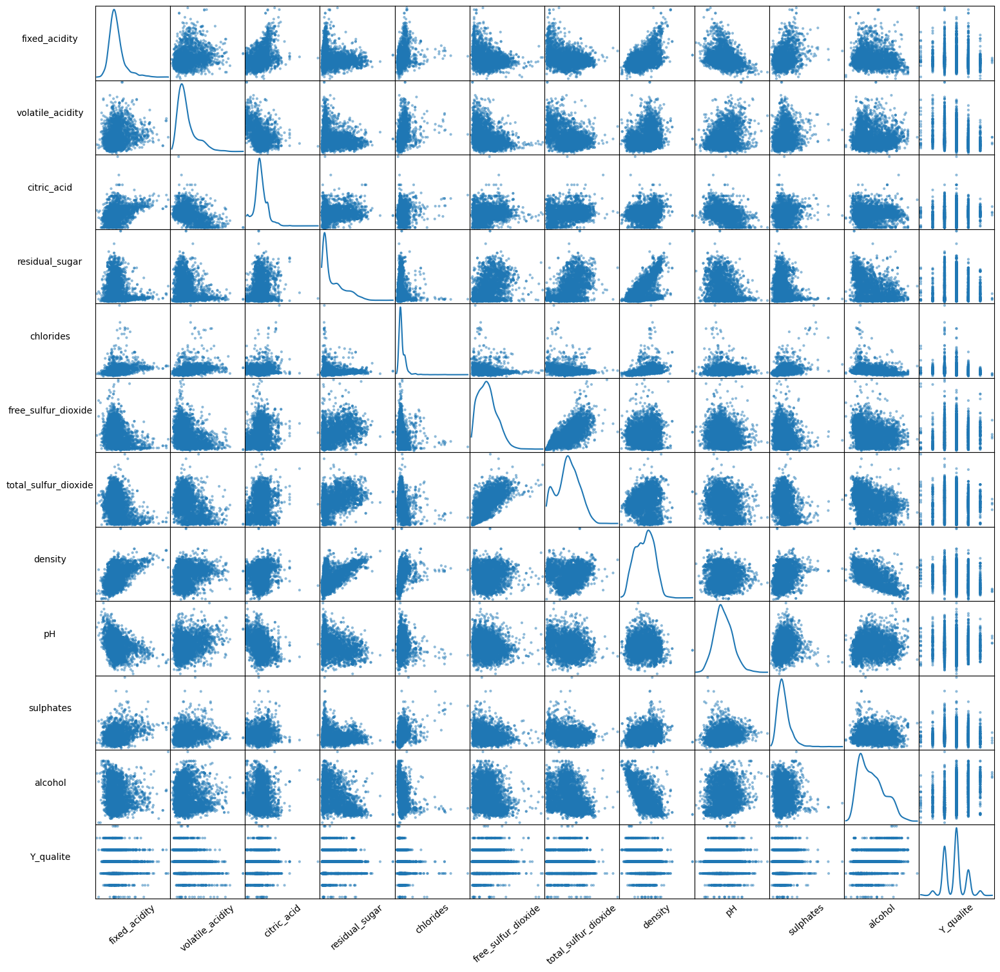

In [ ]:
sm = scatter_matrix(train_without_id, figsize=(18, 18), diagonal='kde')
#Change label rotation
[s.xaxis.label.set_rotation(40) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]
#May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.6,0.5) for s in sm.reshape(-1)]
#Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]
plt.show()

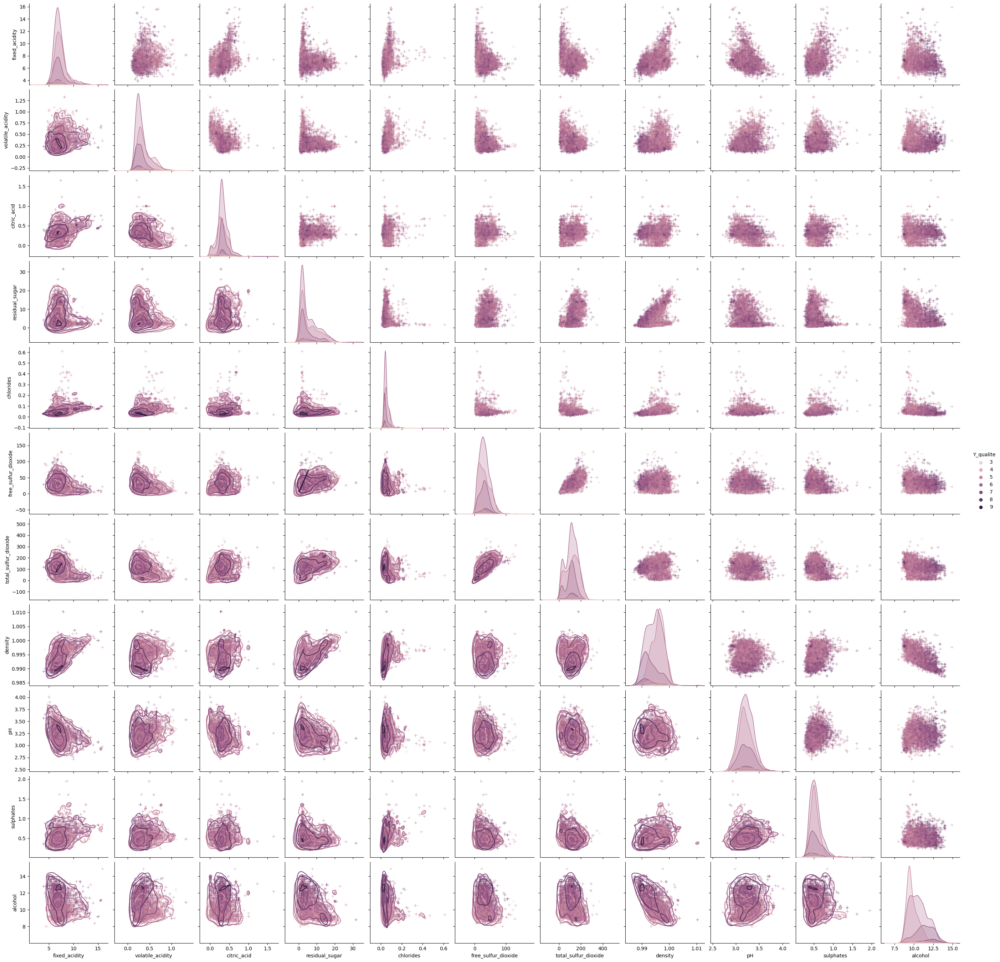

In [60]:
#scatter plots
# df=train[['alcohol','volatile_acidity','density',' Z_qualite']]
df=train[['Y_qualite', 'fixed_acidity',
       'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides',
       'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH',
       'sulphates', 'alcohol']]
g=sns.pairplot(df,hue='Y_qualite', plot_kws=dict(marker="+", linewidth=1, alpha= 0.5),  diag_kind="kde")

g.map_lower(sns.kdeplot, levels=4, color=".2")


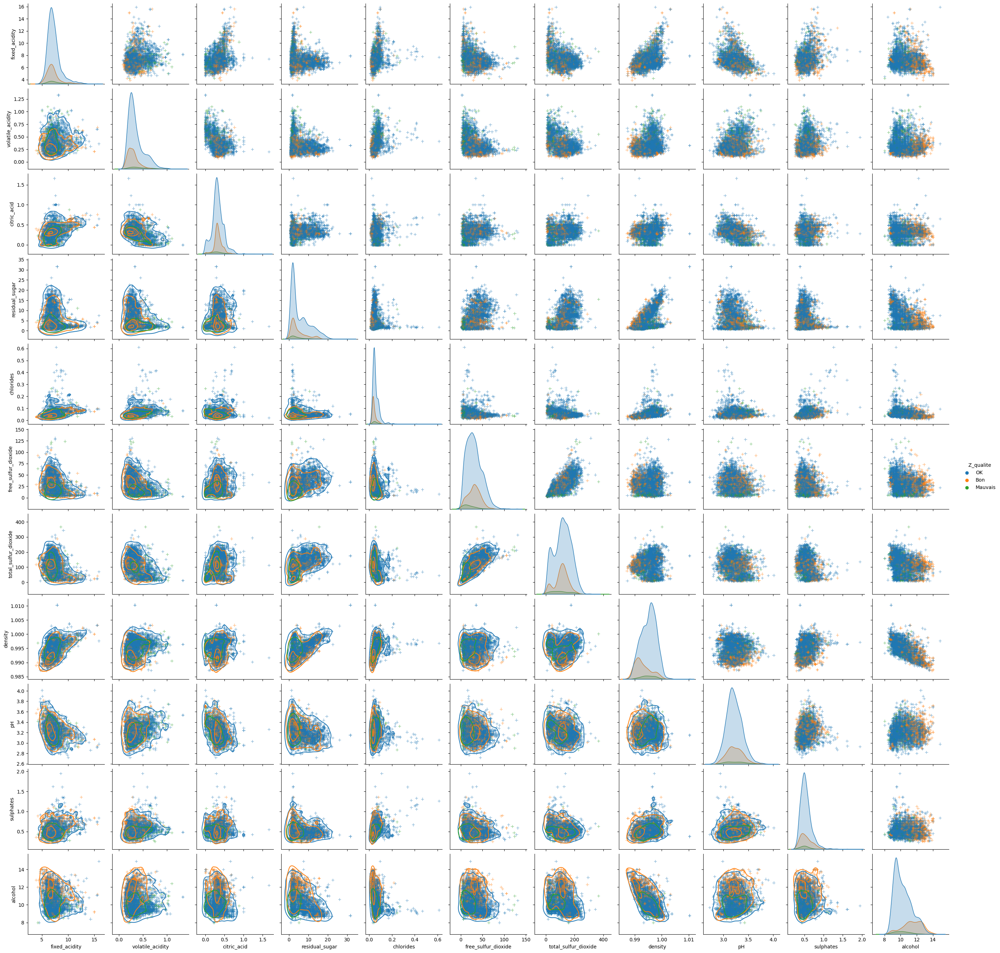

In [61]:
#scatter plots
# df=train[['alcohol','volatile_acidity','density',' Z_qualite']]
df=train[[' Z_qualite', 'fixed_acidity',
       'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides',
       'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH',
       'sulphates', 'alcohol']]
g=sns.pairplot(df,hue=' Z_qualite', plot_kws=dict(marker="+", linewidth=1, alpha= 0.5),  diag_kind="kde")

g.map_lower(sns.kdeplot, levels=4, color=".2")

**Graphique de dispersion**

En examinant le graphique de dispersion, il est plus difficile de conclure quelle variable sera la plus efficace pour prédire la qualité du vin. On observe des distributions très complexes entre les variables, lesquelles ont le potentiel d'aider à expliquer la qualité si elles sont utilisées dans un modèle non linéaire.

---

**Scatter plot**

By examining the scatter plot, it is more difficult to conclude which variable will be the most effective in predicting the quality of the wine. Complex distributions are observed between the variables, which have the potential to help explain quality if used in a non-linear model.

### Check the data again the color of the wine

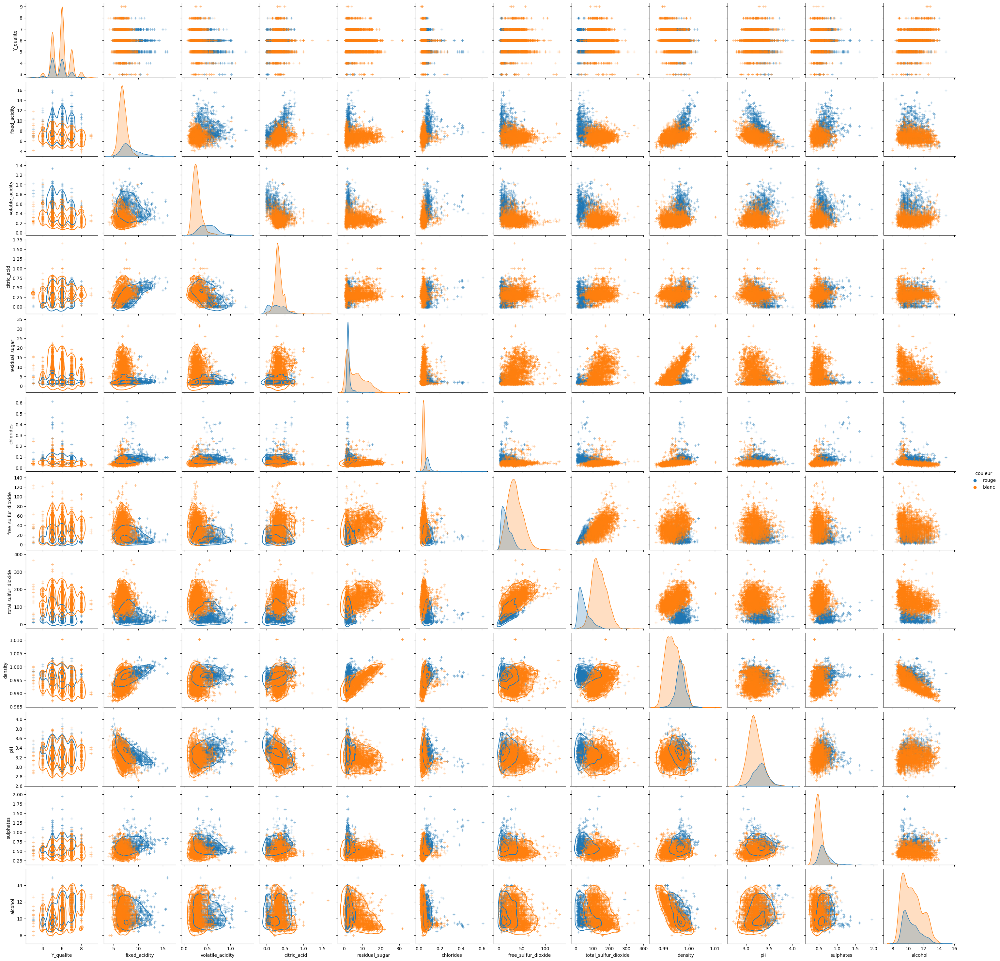

In [ ]:
#scatter plots
# df=train[['alcohol','volatile_acidity','density',' Z_qualite']]
df=train[['Y_qualite', ' couleur', 'fixed_acidity',
       'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides',
       'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH',
       'sulphates', 'alcohol']]
g=sns.pairplot(df,hue=' couleur', plot_kws=dict(marker="+", linewidth=1, alpha= 0.5),  diag_kind="kde")

g.map_lower(sns.kdeplot, levels=4, color=".2")


Après avoir effectué notre analyse préliminaire, la prochaine étape importante est d'examiner l'effet de la variable catégorique du type de vin (blanc ou rouge). Pour ce faire, nous reprenons le graphique de dispersion et identifions les observations selon la couleur du vin.

Premièrement, nous observons que les distributions entre les variables changent considérablement entre les deux types de vin. Nous avons précédemment constaté que certaines variables pouvaient être expliquées par un mélange de lois de probabilité, et nous observons maintenant que la couleur du vin est la variable explicative de ce phénomène. Avec cette information en tête, nous pouvons envisager l'utilisation d'un seul modèle pour la classification de la qualité d'un vin, car les différences entre les distributions des deux couleurs sont significatives.

---

After performing our preliminary analysis, the next important step is to examine the effect of the categorical variable of wine type (white or red). To do this, we revisit the scatter plot and identify observations based on wine color.

Firstly, we observe that the distributions between the variables change significantly between the two types of wine. We previously noted that some variables could be explained by a mixture of probability laws, and we now observe that wine color is the explanatory variable for this phenomenon. With this information in mind, we can consider using a single model for the classification of wine quality, as the differences between the distributions of the two colors are significant.








## b) Using the stepwise regression method, develop a regression model of Y based on the 11 physicochemical variables for all red and white wines. Identify the critical (important) variables for wine quality.

In [13]:
!pip install mlxtend

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [14]:
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib

In [15]:
import pandas as pd
import numpy as np
from sklearn import linear_model
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [16]:
train.head()

,ID,groupe,Y_qualite,Z_qualite,couleur,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,1,train,5,OK,rouge,7.4,0.70,0.00,1.9,0.076,11.0,34,0.9978,3.51,0.56,9.4
3,4,train,6,OK,rouge,11.2,0.28,0.56,1.9,0.075,17.0,60,0.9980,3.16,0.58,9.8
4,5,train,5,OK,rouge,7.4,0.70,0.00,1.9,0.076,11.0,34,0.9978,3.51,0.56,9.4
5,6,train,5,OK,rouge,7.4,0.66,0.00,1.8,0.075,13.0,40,0.9978,3.51,0.56,9.4
6,7,train,5,OK,rouge,7.9,0.60,0.06,1.6,0.069,15.0,59,0.9964,3.30,0.46,9.4


In [17]:
X = train[feature_colum_names]
y = train["Y_qualite"]

In [18]:
lr = linear_model.LinearRegression()

sfs = SFS(lr,
          k_features='parsimonious',
          verbose=1,
          scoring='r2',
        )

sfs = sfs.fit(X, y)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:    0.2s finished
Features: 1/11[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.3s finished
Features: 2/11[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.2s finished
Features: 3/11[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.3s finished
Features: 4/11[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.2s finished
Features: 5/11[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.2s finished
Features: 6/11[Parallel(

In [19]:
pd.DataFrame.from_dict(sfs.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(10,)","[0.21891055112566993, 0.13453147336658744, 0.1...",0.181322,"(alcohol,)",0.068358,0.053185,0.026593
2,"(1, 10)","[0.25471669916812845, 0.2273977968491706, 0.21...",0.232546,"(volatile_acidity, alcohol)",0.049955,0.038866,0.019433
3,"(1, 9, 10)","[0.29410005758314806, 0.23928127306733826, 0.2...",0.243153,"(volatile_acidity, sulphates, alcohol)",0.059685,0.046437,0.023219
4,"(1, 7, 9, 10)","[0.30733019060200273, 0.22550632169702645, 0.2...",0.247199,"(volatile_acidity, density, sulphates, alcohol)",0.060321,0.046932,0.023466
5,"(1, 2, 7, 9, 10)","[0.31061451827790276, 0.2267069616733589, 0.22...",0.248621,"(volatile_acidity, citric_acid, density, sulph...",0.061188,0.047606,0.023803
6,"(1, 2, 4, 7, 9, 10)","[0.3075003881583863, 0.22796181985581687, 0.22...",0.24761,"(volatile_acidity, citric_acid, chlorides, den...",0.060151,0.0468,0.0234
7,"(1, 2, 4, 7, 8, 9, 10)","[0.30575549911191724, 0.22722154822620955, 0.2...",0.246537,"(volatile_acidity, citric_acid, chlorides, den...",0.058374,0.045417,0.022708
8,"(1, 2, 4, 6, 7, 8, 9, 10)","[0.29082216724573295, 0.22351907159615614, 0.2...",0.241388,"(volatile_acidity, citric_acid, chlorides, tot...",0.055245,0.042982,0.021491
9,"(1, 2, 4, 5, 6, 7, 8, 9, 10)","[0.2974663705546039, 0.22459495710999167, 0.23...",0.249298,"(volatile_acidity, citric_acid, chlorides, fre...",0.05101,0.039687,0.019844
10,"(0, 1, 2, 4, 5, 6, 7, 8, 9, 10)","[0.2234303603699752, 0.21145530138156032, 0.23...",0.232133,"(fixed_acidity, volatile_acidity, citric_acid,...",0.041956,0.032643,0.016322


Now we need to compare it with $R^2$ nd other metrics

In [20]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from pprint import pprint

In [78]:
def print_results(y_pred, y, results_name="Results", r2=True):
    print(results_name)
    
    print(f"MAE: {mean_absolute_error(y_pred, y)}")

    results = [1 for i in range(len(y)) if int(y_pred[i]) == y.iloc[i]]
    accuracy = np.sum(results) / len(y)
    print(f"  Accuracy: {round(accuracy * 100, 2)}%")

    results_less_precise = [1 for i in range(len(y)) if abs(y_pred[i] - y.iloc[i]) < 1]
    accuracy = np.sum(results_less_precise) / len(y)
    print(f"  Accuracy +/- 1: {round(accuracy * 100, 2)}%")


    if r2:
        print(f"  R2: {r2_score(y, y_pred)}")

def print_results_by_quality(y_pred, y, results_name="Results"):
    print(results_name)

    qualities = y.unique()

    print("Rounded")    
    by_bucket = {quality: {'good': 0, 'wrong': 0} for quality in qualities}
    for i in range(len(y)):
        if int(y_pred[i]) == y.iloc[i]:
            by_bucket[y.iloc[i]]['good'] += 1
        else:
            by_bucket[y.iloc[i]]['wrong'] += 1

    for quality in sorted(qualities):
        accuracy = by_bucket[quality]['good'] / (by_bucket[quality]['good'] + by_bucket[quality]['wrong'])
        print(f" Accuracy of quality {quality}: {round(accuracy * 100, 2)}%   |    {by_bucket[quality]['good'] + by_bucket[quality]['wrong']} data point")

    print("+/- 1")    
    by_bucket = {quality: {'good': 0, 'wrong': 0} for quality in qualities}
    for i in range(len(y)):
        if abs(y_pred[i] - y.iloc[i]) < 1:
            by_bucket[y.iloc[i]]['good'] += 1
        else:
            by_bucket[y.iloc[i]]['wrong'] += 1

    for quality in sorted(qualities):
        accuracy = by_bucket[quality]['good'] / (by_bucket[quality]['good'] + by_bucket[quality]['wrong'])
        print(f" Accuracy of quality {quality}: {round(accuracy * 100, 2)}%   |    {by_bucket[quality]['good'] + by_bucket[quality]['wrong']} data point")


    plt.figure(figsize=(10,10))
    plt.scatter(y, y_pred, c='crimson')
    p1 = max(max(y_pred), max(y))
    p2 = min(min(y_pred), min(y))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('True Values', fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.axis('equal')
    plt.grid()
    plt.show()

In [79]:
X_test = test[feature_colum_names]
y_test = test["Y_qualite"]

In [80]:
X_train_sfs = sfs.transform(X)
X_test_sfs = sfs.transform(X_test)

lr.fit(X_train_sfs, y)
y_pred = lr.predict(X_test_sfs)

k = len(sfs.k_feature_names_)
n = X.shape[0]
r2 = sfs.k_score_
adj_r2 = 1 - (1 - sfs.k_score_) * ((n - 1) / (n - k - 1))

print(f'Train R2: {r2}')
print(f'Train adjusted R2: {adj_r2}')
print(f'Test R2: {r2_score(y_test, y_pred)}')
print(f'k: {k}')
pprint(list(sfs.k_feature_names_))
print(pd.concat([pd.DataFrame(sfs.k_feature_names_),pd.DataFrame(np.transpose(lr.coef_))], axis = 1))

Train R2: 0.24315340605607613
Train adjusted R2: 0.24257300222636458
Test R2: 0.24852899541878593
k: 3
['volatile_acidity', 'sulphates', 'alcohol']
                  0     0
0  volatile_acidity -1.43
1         sulphates  0.53
2           alcohol  0.32


In [81]:
print_results(lr.predict(X_train_sfs), y, "Train results", False)
print_results(lr.predict(X_test_sfs), y_test, "\nTest results", False)


Train results
MAE: 0.5807359558922326
  Accuracy: 45.35%
  Accuracy +/- 1: 85.01%

Test results
MAE: 0.5836987323530436
  Accuracy: 44.86%
  Accuracy +/- 1: 85.28%


Train results
Rounded
 Accuracy of quality 3: 0.0%   |    19 data point
 Accuracy of quality 4: 9.4%   |    117 data point
 Accuracy of quality 5: 84.09%   |    1263 data point
 Accuracy of quality 6: 40.35%   |    1735 data point
 Accuracy of quality 7: 0.46%   |    658 data point
 Accuracy of quality 8: 0.0%   |    120 data point
 Accuracy of quality 9: 0.0%   |    4 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    19 data point
 Accuracy of quality 4: 9.4%   |    117 data point
 Accuracy of quality 5: 88.99%   |    1263 data point
 Accuracy of quality 6: 98.9%   |    1735 data point
 Accuracy of quality 7: 72.64%   |    658 data point
 Accuracy of quality 8: 0.0%   |    120 data point
 Accuracy of quality 9: 0.0%   |    4 data point


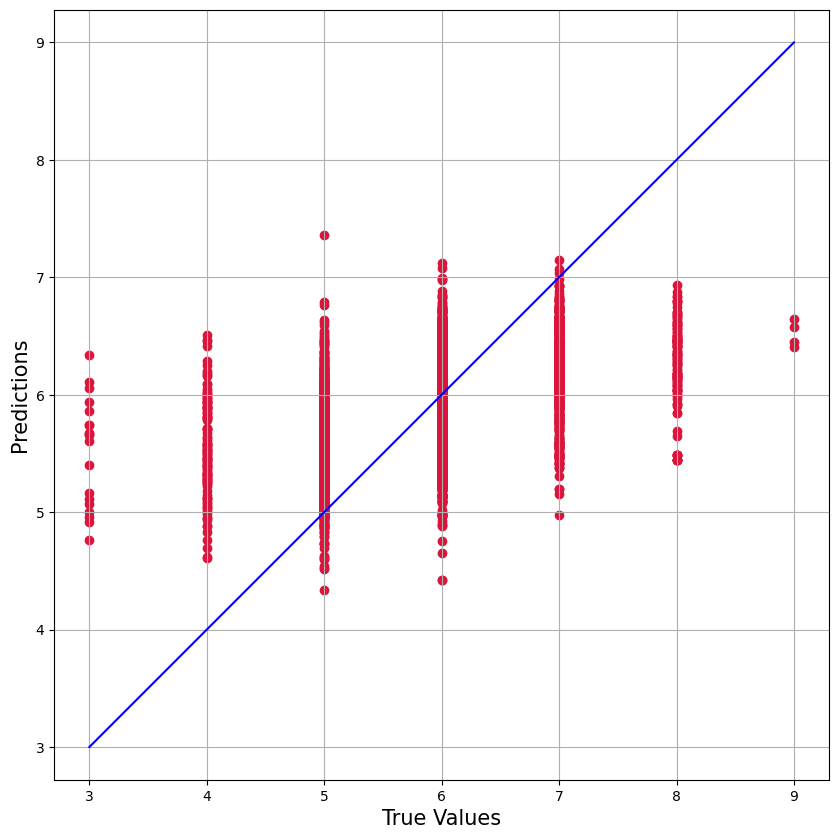


Test results
Rounded
 Accuracy of quality 3: 0.0%   |    6 data point
 Accuracy of quality 4: 14.55%   |    55 data point
 Accuracy of quality 5: 82.45%   |    433 data point
 Accuracy of quality 6: 36.73%   |    550 data point
 Accuracy of quality 7: 0.0%   |    189 data point
 Accuracy of quality 8: 0.0%   |    30 data point
 Accuracy of quality 9: 0.0%   |    1 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    6 data point
 Accuracy of quality 4: 14.55%   |    55 data point
 Accuracy of quality 5: 87.99%   |    433 data point
 Accuracy of quality 6: 99.82%   |    550 data point
 Accuracy of quality 7: 74.07%   |    189 data point
 Accuracy of quality 8: 0.0%   |    30 data point
 Accuracy of quality 9: 0.0%   |    1 data point


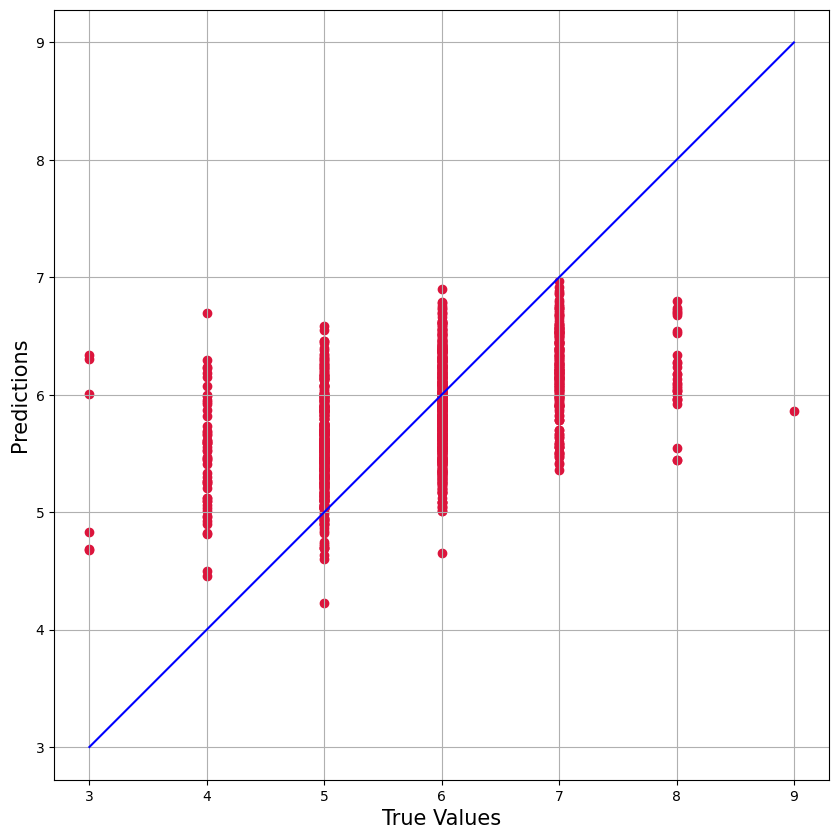

In [82]:
print_results_by_quality(lr.predict(X_train_sfs), y, "Train results")
print_results_by_quality(lr.predict(X_test_sfs), y_test, "\nTest results")

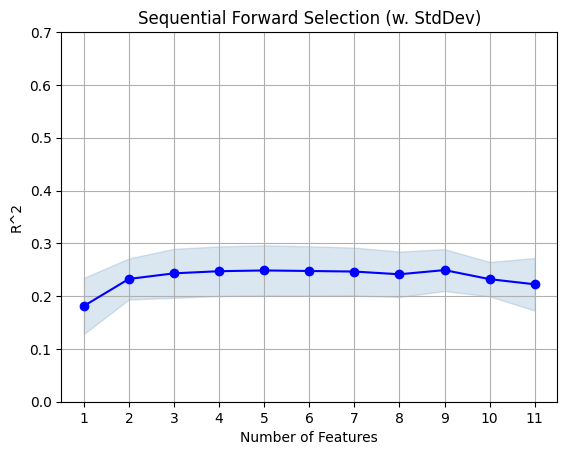

In [83]:
fig = plot_sfs(sfs.get_metric_dict(), ylabel='R^2')
plt.ylim([0, 0.7])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [84]:
y_train_pred = lr.predict(X_train_sfs)

red_pred = []
red_true = []
white_pred = []
white_true = []

for i in range(len(y_train_pred)):
    if train.iloc[i][' couleur'] == 'rouge':
        red_pred.append(y_train_pred[i])
        red_true.append(train.iloc[i]['Y_qualite'])
    else:
        white_pred.append(y_train_pred[i])
        white_true.append(train.iloc[i]['Y_qualite'])

print_results(red_pred, pd.DataFrame(red_true)[0], "\nTrain results for red wine", False)
print(f"{len(red_pred)} red wine")
print_results(white_pred, pd.DataFrame(white_true)[0], "\nTrain results for white wine", False)
print(f"{len(white_pred)} white wine")


y_test_pred = lr.predict(X_test_sfs)

red_pred = []
red_true = []
white_pred = []
white_true = []

for i in range(len(y_test_pred)):
    if test.iloc[i][' couleur'] == 'rouge':
        red_pred.append(y_test_pred[i])
        red_true.append(test.iloc[i]['Y_qualite'])
    else:
        white_pred.append(y_test_pred[i])
        white_true.append(test.iloc[i]['Y_qualite'])

print_results(red_pred, pd.DataFrame(red_true)[0], "\nTest results for red wine", False)
print(f"{len(red_pred)} red wine")
print_results(white_pred, pd.DataFrame(white_true)[0], "\nTest results for white wine", False)
print(f"{len(white_pred)} white wine")


Train results for red wine
MAE: 0.5151888557297876
  Accuracy: 46.78%
  Accuracy +/- 1: 88.66%
979 red wine

Train results for white wine
MAE: 0.6025849892797143
  Accuracy: 44.88%
  Accuracy +/- 1: 83.79%
2937 white wine

Test results for red wine
MAE: 0.49021393235248084
  Accuracy: 47.12%
  Accuracy +/- 1: 90.71%
312 red wine

Test results for white wine
MAE: 0.6143366079834802
  Accuracy: 44.12%
  Accuracy +/- 1: 83.51%
952 white wine


La première analyse révèle que la majorité de la variance peut être expliquée par seulement trois variables, et l'utilisation de ces variables est suffisante pour établir un modèle linéaire. Ces variables sont : 
* volatile_acidity, 
* sulphates
* alcohol. 

La première métrique d'analyse est $R^2$ ajusté. Il est important de prendre en compte que dans notre cas, nous avons un output continue et une variable cible continue. (La métrique couramment utilisée dans cette situation est l'erreur absolue moyenne (MAE) qui représente la différence absolue moyenne entre les prédictions continues et les valeurs de référence discrètes et celle-ci sera présentée directement par la suite.)


Avec l'inclusion de ces variables, le modèle atteint un R² ajusté (métrique est calculé avec un output continue et une variable de référence discrète; ex.: output de 4.66621 et vraie valeur de 5) de 0.2425 sur l'ensemble d'entraînement. L'observation de cette mesure avec plusieurs modèles (en ajoutant une variable indépendante à chaque modèle) a révélé que l'ajout de variables supplémentaires n'améliore pas la capacité de ce modèle à expliquer la variance.


Comme mentionné précédemment, la bonne métrique pour analyser la qualité du modèle est celle de l'erreur absolue moyenne. Avec cette métrique, on se rend compte que le modèle permet de bien prédire la qualité d'un vin. On a une métrique MAE de $0.580$ pour l'ensemble d'entrainement et de $0.5836$ pour l'ensemble de tests. Ce résultat montre que capable de généraliser correctement sur de nouvelles données.

Une autre mesure intéressante à considérer est la précision du modèle à prédire le score exact. En arrondissant les prédictions (puisque le modèle fournit une variable continue alors que le score est discret de 1 à 10), le modèle atteint une précision de 45% pour les deux ensembles. En étendant la tolérance à ± 1 point de la valeur réelle, la précision est de 85%. Étant donné que l'évaluation de la qualité d'un vin peut être très subjective, le modèle obtenu peut être considéré comme de très haute qualité.

Après une analyse complète des résultats du modèle, il est pertinent d'évaluer si les performances sont similaires pour les deux types de vin (rouge et blanc). En examinant les performances de manière indépendante selon la couleur du vin, il est observé que le modèle performe un peu mieux pour les vins rouges (MAE de 0.49 pour l'ensemble de test) que pour les vins blancs (MAE de 0.61 pour l'ensemble de test). Cependant, le modèle permet une bonne généralisation pour les deux types de vin, car la précision avec l'arrondi est à peu près la même, avec une différence de 3 %, et de 7 % si la note est à +/- 1 de la vraie valeur. Par contre, il convient d'étudier si deux modèles différents peuvent améliorer les résultats.

---

The initial analysis shows that the majority of the variance can be explained by only three variables, and the use of these variables is sufficient to establish a linear model. These variables are:

* volatile_acidity
* sulphates
* alcohol


The first metric of analysis is the adjusted R². It is important to note that in our case, we have a continuous output and a continuous target variable. (The metric commonly used in this situation is the mean absolute error (MAE), which represents the average absolute difference between continuous predictions and discrete reference values and will be presented directly below.)

With the inclusion of these variables, the model achieves an adjusted R² (metric calculated with a continuous output and a discrete reference variable; e.g.: output of 4.66621 and true value of 5) of 0.2425 on the training set. Observing this metric with several models (by adding an independent variable to each model) revealed that adding additional variables does not improve the ability of this model to explain variance.

As mentioned earlier, the appropriate metric for analyzing the quality of the model is the MAE. With this metric, we see that the model can accurately predict the quality of wine. We have an MAE metric of $0.580$ for the training set and $0.5836$ for the test set. This result shows that the model is capable of generalizing well to new data.

Another interesting measure to consider is the model's accuracy in predicting the exact score. By rounding predictions (since the model provides a continuous variable while the score is discrete from 1 to 10), the model achieves an accuracy of 45% for both sets. By extending the tolerance to ±1 point from the true value, the accuracy is 85%. Given that the evaluation of wine quality can be highly subjective, the resulting model can be considered of very high quality.

After a complete analysis of the model results, it is relevant to evaluate whether the performance is similar for both types of wine (red and white). By examining the performance independently by wine color, it is observed that the model performs slightly better for red wines (MAE of 0.49 for the test set) than for white wines (MAE of 0.61 for the test set). However, the model allows for good generalization for both types of wine, as the precision with rounding is approximately the same, with a difference of 3%, and 7% if the score is at +/- 1 from the true value. It is therefore worth considering whether two different models could improve the results.


**Validation**

In [85]:
X_valid = valid[feature_colum_names]
y_valid = valid["Y_qualite"]

In [86]:
X_valid_sfs = sfs.transform(X_valid)
y_pred_v = lr.predict(X_valid_sfs)

print(f'Train R2:\t {r2}')
print(f'Test  R2:\t {r2_score(y_test, y_pred)}')
print(f'Valid R2:\t {r2_score(y_valid, y_pred_v)}')

Train R2:	 0.24315340605607613
Test  R2:	 0.24852899541878593
Valid R2:	 0.2818505824126498


Let's quickly compare with the full model

In [87]:
regression_model = linear_model.LinearRegression()
regression_model.fit(X, y)

LinearRegression()

In [88]:
y_pred = regression_model.predict(X)
print_results(y_pred, y, "Training results")
y_pred = regression_model.predict(X_test)
print_results(y_pred, y_test, "Test results")
y_pred = regression_model.predict(X_valid)
print_results(y_pred, y_valid, "Test results")

Training results
MAE: 0.5683178960680546
  Accuracy: 45.63%
  Accuracy +/- 1: 85.11%
  R2: 0.2902849192742134
Test results
MAE: 0.5693086736879984
  Accuracy: 45.65%
  Accuracy +/- 1: 86.23%
  R2: 0.2744306582787367
Test results
MAE: 0.5728329578395498
  Accuracy: 46.39%
  Accuracy +/- 1: 85.5%
  R2: 0.30686341922032045


On voit qu'avec tous les variables, presque aucune précision n'est gagnée

---

We see that with all the variables, almost no precision is gained. 

## c) Is the conclusion the same if we do the 30b) analyses separating the wines by color? 

note: develop the models on the train set only; the different prediction models will be compared on the test set.

In [89]:
train.head()

,ID,groupe,Y_qualite,Z_qualite,couleur,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,1,train,5,OK,rouge,7.40,0.70,0.00,1.90,0.08,11.00,34,1.00,3.51,0.56,9.40
3,4,train,6,OK,rouge,11.20,0.28,0.56,1.90,0.07,17.00,60,1.00,3.16,0.58,9.80
4,5,train,5,OK,rouge,7.40,0.70,0.00,1.90,0.08,11.00,34,1.00,3.51,0.56,9.40
5,6,train,5,OK,rouge,7.40,0.66,0.00,1.80,0.07,13.00,40,1.00,3.51,0.56,9.40
6,7,train,5,OK,rouge,7.90,0.60,0.06,1.60,0.07,15.00,59,1.00,3.30,0.46,9.40


In [90]:
def step_forward_regression(train, test, feature_colum_names, y_column_name):

    X_train, y_train = train[feature_colum_names], train[y_column_name]
    X_test, y_test = test[feature_colum_names], test[y_column_name]


    lr = linear_model.LinearRegression()

    sfs = SFS(lr,
            k_features='parsimonious',
            verbose=0,
            scoring='r2',
            )

    sfs = sfs.fit(X_train, y_train)

    display(pd.DataFrame.from_dict(sfs.get_metric_dict()).T)

    X_train_sfs = sfs.transform(X_train)
    X_test_sfs = sfs.transform(X_test)

    lr.fit(X_train_sfs, y_train)
    y_pred = lr.predict(X_test_sfs)

    k = len(sfs.k_feature_names_)
    n = X.shape[0]
    r2 = sfs.k_score_
    adj_r2 = 1 - (1 - sfs.k_score_) * ((n - 1) / (n - k - 1))

    print(f'\nTrain R2: {r2}')
    print(f'Train adjusted R2: {adj_r2}')
    print(f'Test R2: {r2_score(y_test, y_pred)}')
    print(f'k: {k}')
    pprint(list(sfs.k_feature_names_))
    print(pd.concat([pd.DataFrame(sfs.k_feature_names_),pd.DataFrame(np.transpose(lr.coef_))], axis = 1))
    print("")
    print_results(lr.predict(X_train_sfs), y_train, "Train results", False)
    print_results(y_pred, y_test, "Test results", False)

    print_results_by_quality(y_pred, y_test, "\nTest results")

    fig = plot_sfs(sfs.get_metric_dict(), ylabel='R^2')
    plt.ylim([0, 0.7])
    plt.title('Sequential Forward Selection (w. StdDev)')
    plt.grid()
    plt.show()

In [91]:
# Split by color
train_red = train[train[" couleur"] == 'rouge']
train_white = train[train[" couleur"] == 'blanc']

test_red = test[test[" couleur"] == 'rouge']
test_white = test[test[" couleur"] == 'blanc']

~~~ Step forward red wine ~~~~~~~~~~


,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(10,)","[0.10779550826825679, 0.1712356710670322, 0.22...",0.18,"(alcohol,)",0.12,0.09,0.05
2,"(1, 10)","[0.22270760842253423, 0.2562386427851072, 0.25...",0.27,"(volatile_acidity, alcohol)",0.11,0.09,0.04
3,"(1, 9, 10)","[0.1737113459998343, 0.3124574021667237, 0.269...",0.28,"(volatile_acidity, sulphates, alcohol)",0.12,0.09,0.05
4,"(1, 6, 9, 10)","[0.2326590166348418, 0.3447043079539587, 0.265...",0.30,"(volatile_acidity, total_sulfur_dioxide, sulph...",0.12,0.10,0.05
5,"(1, 4, 6, 9, 10)","[0.2522024726700586, 0.3558421853675273, 0.270...",0.31,"(volatile_acidity, chlorides, total_sulfur_dio...",0.12,0.10,0.05
6,"(1, 4, 6, 8, 9, 10)","[0.2521941358652906, 0.36810900224473064, 0.26...",0.31,"(volatile_acidity, chlorides, total_sulfur_dio...",0.12,0.09,0.05
7,"(1, 3, 4, 6, 8, 9, 10)","[0.2553223136632905, 0.36320323130325094, 0.26...",0.31,"(volatile_acidity, residual_sugar, chlorides, ...",0.11,0.09,0.04
8,"(1, 2, 3, 4, 6, 8, 9, 10)","[0.25489399146925595, 0.35814818741196075, 0.2...",0.31,"(volatile_acidity, citric_acid, residual_sugar...",0.11,0.09,0.04
9,"(1, 2, 3, 4, 5, 6, 8, 9, 10)","[0.25447606827717384, 0.35708361075581496, 0.2...",0.31,"(volatile_acidity, citric_acid, residual_sugar...",0.11,0.09,0.04
10,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10)","[0.23517192585321833, 0.35207657205636933, 0.2...",0.30,"(volatile_acidity, citric_acid, residual_sugar...",0.11,0.09,0.04



Train R2: 0.29598612982826933
Train adjusted R2: 0.29526609518733693
Test R2: 0.31712888246375237
k: 4
['volatile_acidity', 'total_sulfur_dioxide', 'sulphates', 'alcohol']
                      0     0
0      volatile_acidity -1.06
1  total_sulfur_dioxide -0.00
2             sulphates  0.81
3               alcohol  0.29

Train results
MAE: 0.49967494185832656
  Accuracy: 47.09%
  Accuracy +/- 1: 88.15%
Test results
MAE: 0.5014163987954015
  Accuracy: 49.04%
  Accuracy +/- 1: 88.78%

Test results
Rounded
 Accuracy of quality 3: 0.0%   |    3 data point
 Accuracy of quality 4: 16.67%   |    12 data point
 Accuracy of quality 5: 83.57%   |    140 data point
 Accuracy of quality 6: 27.64%   |    123 data point
 Accuracy of quality 7: 0.0%   |    32 data point
 Accuracy of quality 8: 0.0%   |    2 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    3 data point
 Accuracy of quality 4: 16.67%   |    12 data point
 Accuracy of quality 5: 92.14%   |    140 data point
 Accuracy of quality 6: 

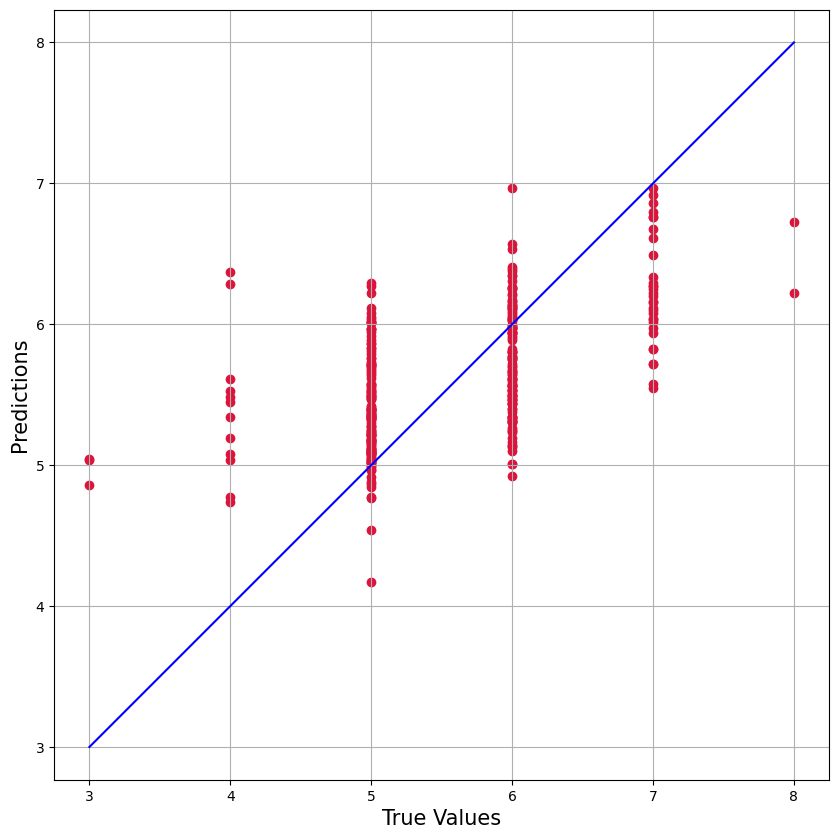

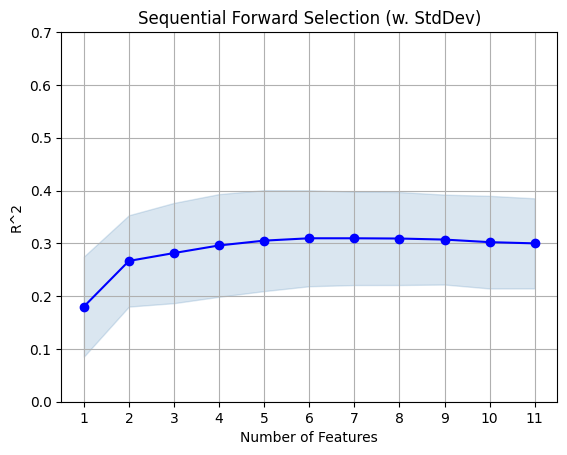

In [92]:
print("~~~ Step forward red wine ~~~~~~~~~~")
step_forward_regression(train_red, test_red, feature_colum_names, "Y_qualite")

En analysant nos ensembles de données séparément par type de vin, nous observons que le modèle de prédiction pour les vins rouges donne de meilleurs résultats. En utilisant la méthode step forward, nous obtenons un modèle comportant une variable supplémentaire, soit :

- volatile_acidity
- total_sulfur_dioxide
- sulphates
- alcohol

Ce modèle permet une légère amélioration de l'erreur absolue moyenne, à $0.5014$ pour l'ensemble de test. Cette amélioration se traduit également par une amélioration de la précision du modèle, avec une augmentation d'environ $2$%.

---

By analyzing our data sets separately by wine type, we observe that the prediction model for red wines performs better. Using the step forward method, we obtain a model with an additional variable, namely:

- volatile_acidity
- total_sulfur_dioxide
- sulphates
- alcohol

This model allows for a slight improvement in the mean absolute error, with $0.5014$ for the test set. This improvement also translates into an improvement in model accuracy, with an increase of approximately 2%.

~~~ Step forward white wine ~~~~~~~~~~


,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(10,)","[0.15260715648012324, 0.2118564706646776, 0.18...",0.17,"(alcohol,)",0.07,0.05,0.03
2,"(1, 10)","[0.2115648224676272, 0.2632672032769846, 0.215...",0.23,"(volatile_acidity, alcohol)",0.05,0.04,0.02
3,"(1, 3, 10)","[0.17451825737515614, 0.2912300358740947, 0.23...",0.24,"(volatile_acidity, residual_sugar, alcohol)",0.07,0.06,0.03
4,"(1, 3, 5, 10)","[0.17869962729239708, 0.3057354257845972, 0.24...",0.24,"(volatile_acidity, residual_sugar, free_sulfur...",0.07,0.06,0.03
5,"(1, 3, 5, 7, 10)","[0.17453905074924658, 0.29903650712418683, 0.2...",0.24,"(volatile_acidity, residual_sugar, free_sulfur...",0.07,0.06,0.03
6,"(1, 3, 5, 7, 8, 10)","[0.19397427825220448, 0.30305083994174875, 0.2...",0.25,"(volatile_acidity, residual_sugar, free_sulfur...",0.07,0.06,0.03
7,"(0, 1, 3, 5, 7, 8, 10)","[0.19731625034942157, 0.3042741965822465, 0.25...",0.25,"(fixed_acidity, volatile_acidity, residual_sug...",0.07,0.05,0.03
8,"(0, 1, 3, 5, 6, 7, 8, 10)","[0.19743846989395375, 0.30449202432003275, 0.2...",0.25,"(fixed_acidity, volatile_acidity, residual_sug...",0.07,0.05,0.03
9,"(0, 1, 3, 4, 5, 6, 7, 8, 10)","[0.19739280966504658, 0.3044014503364103, 0.25...",0.25,"(fixed_acidity, volatile_acidity, residual_sug...",0.07,0.05,0.03
10,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 10)","[0.1964343688506538, 0.3043660606538837, 0.252...",0.25,"(fixed_acidity, volatile_acidity, citric_acid,...",0.07,0.05,0.03



Train R2: 0.24012043489258553
Train adjusted R2: 0.23934326325862243
Test R2: 0.2321342708147479
k: 4
['volatile_acidity', 'residual_sugar', 'free_sulfur_dioxide', 'alcohol']
                     0     0
0     volatile_acidity -2.11
1       residual_sugar  0.02
2  free_sulfur_dioxide  0.00
3              alcohol  0.37

Train results
MAE: 0.5912446258554843
  Accuracy: 44.06%
  Accuracy +/- 1: 83.38%
Test results
MAE: 0.5981536943452208
  Accuracy: 44.75%
  Accuracy +/- 1: 83.72%

Test results
Rounded
 Accuracy of quality 3: 0.0%   |    3 data point
 Accuracy of quality 4: 23.26%   |    43 data point
 Accuracy of quality 5: 80.55%   |    293 data point
 Accuracy of quality 6: 41.69%   |    427 data point
 Accuracy of quality 7: 1.27%   |    157 data point
 Accuracy of quality 8: 0.0%   |    28 data point
 Accuracy of quality 9: 0.0%   |    1 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    3 data point
 Accuracy of quality 4: 23.26%   |    43 data point
 Accuracy of quality 5: 84.6

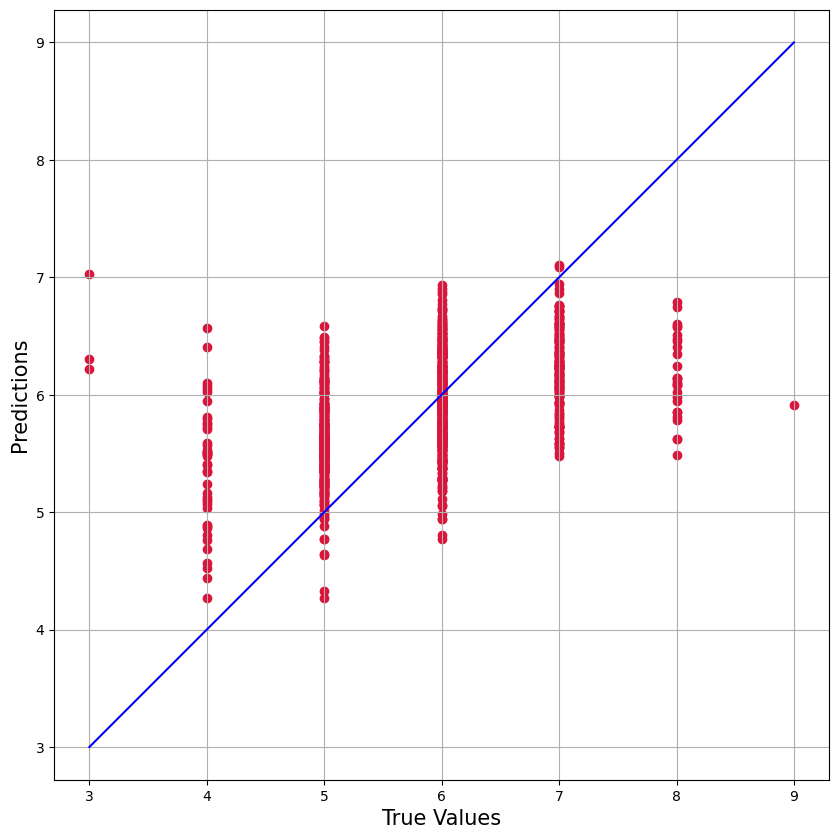

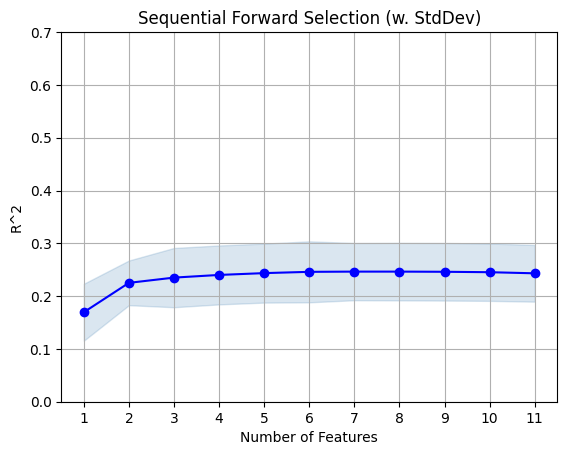

In [93]:
print("~~~ Step forward white wine ~~~~~~~~~~")
step_forward_regression(train_white, test_white, feature_colum_names, "Y_qualite")

Finalement, pour le vin blanc, les variables sélectionnées sont différentes de celles du vin rouge (et du modèle contenant les deux vins). Dans ce cas, nous constatons que les variables les plus explicatives sont :

- volatile_acidity
- residual_sugar
- free_sulfur_dioxide
- alcohol

Nous observons que, comme pour le vin rouge, l'alcool, l'acidité et le soufre sont des caractéristiques importantes pour déterminer la qualité du vin blanc. Cependant, contrairement au vin rouge, la quantité de sucre est également une caractéristique importante, les vins blancs les plus sucrés ayant tendance à obtenir des scores plus élevés (en raison du coefficient positif).

Cependant, l'analyse des résultats montre que ce changement de variables n'améliore que légèrement les résultats. Nous observons une MAE de 0,5981 pour ce modèle contre une MAE de 0,6143 pour le modèle incluant à la fois le vin blanc et le vin rouge. Cette légère diminution de la MAE correspond à une augmentation de la précision de moins d'un pour cent.


---


Ultimately, for white wine, the selected variables are different from those for red wine (and the model containing both wines). In this case, we find that the most explanatory variables are:

- volatile_acidity
- residual_sugar
- free_sulfur_dioxide
- alcohol

We observe that, similar to red wine, alcohol, acidity, and sulfur are important characteristics in determining the quality of white wine. However, unlike red wine, the amount of sugar is also an important characteristic, with sweeter white wines tending to have higher scores (due to the positive coefficient).

However, the analysis of the results shows that this change in variables only slightly improves the results. We observe an MAE of 0.5981 for this model compared to an MAE of 0.6143 for the model including both white and red wine. This slight decrease in MAE corresponds to an increase in precision of less than one percent.

## d) Data mining model

Après avoir constaté que la couleur du vin peut être ignorée et que notre modèle peut classer la qualité d'un vin, quelle que soit sa couleur, uniquement à partir de ses qualités physico-chimiques, nous pouvons alors essayer plusieurs modèles, utilisant uniquement ces caractéristiques, permettant de déterminer la qualité d'un vin de manière plus précise que le modèle de régression linéaire.

---

After having observed that the color of the wine can be ignored and that our model can classify the quality of a wine, no matter its color, only from its physicochemical qualities, we can then try several models, using only these characteristics, allowing to determine the quality of a wine in a more precise way than the linear regression model

In [94]:
!pip install lazypredict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [95]:
from lazypredict.Supervised import LazyRegressor
from sklearn.utils import all_estimators
from sklearn.base import RegressorMixin

In [96]:
X_train, y_train = train[feature_colum_names], train[y_column_name]
X_valid, y_valid = valid[feature_colum_names], valid[y_column_name]

In [97]:

removed_regressors = [
    "TheilSenRegressor",
    "ARDRegression", 
    "CCA", 
    "IsotonicRegression", 
    "StackingRegressor",
    "MultiOutputRegressor", 
    "MultiTaskElasticNet", 
    "MultiTaskElasticNetCV", 
    "MultiTaskLasso", 
    "MultiTaskLassoCV", 
    "PLSCanonical", 
    "PLSRegression", 
    "RadiusNeighborsRegressor", 
    "RegressorChain", 
    "VotingRegressor",
    "QuantileRegressor" 
]


REGRESSORS = [
    est
    for est in all_estimators()
    if (issubclass(est[1], RegressorMixin) and (est[0] not in removed_regressors))
]

In [98]:
# fitting data in LazyRegressor
reg = LazyRegressor(verbose=2,
                    ignore_warnings=False,
                    custom_metric=None,
                    regressors=REGRESSORS)
  
# fitting data in LazyClassifier
models, predictions = reg.fit(X_train, X_valid,
                              y_train, y_valid)

# lets check which model did better
print(models)

'tuple' object has no attribute '__name__'
Invalid Regressor(s)


  3%|▎         | 1/39 [00:00<00:23,  1.61it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.32142666502614714, 'Adjusted R-Squared': 0.31570688978881967, 'RMSE': 0.7277386460810777, 'Time taken': 0.6186122894287109}


 10%|█         | 4/39 [00:01<00:08,  4.26it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.46751253222625233, 'Adjusted R-Squared': 0.4630241321147496, 'RMSE': 0.6446615070081906, 'Time taken': 0.38350892066955566}
{'Model': 'BayesianRidge', 'R-Squared': 0.3065525766271512, 'Adjusted R-Squared': 0.30070742593205446, 'RMSE': 0.7356712988275821, 'Time taken': 0.036440372467041016}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.0066875475544985186, 'Adjusted R-Squared': -0.0016852010868044776, 'RMSE': 0.8804809895556341, 'Time taken': 0.1327216625213623}
{'Model': 'DummyRegressor', 'R-Squared': -8.012510891752811e-05, 'Adjusted R-Squared': -0.008509919266923571, 'RMSE': 0.8834753604849702, 'Time taken': 0.02194952964782715}
{'Model': 'ElasticNet', 'R-Squared': -8.012510891752811e-05, 'Adjusted R-Squared': -0.008509919266923571, 'RMSE': 0.8834753604849702, 'Time taken': 0.03420543670654297}


 18%|█▊        | 7/39 [00:01<00:05,  5.80it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.2939545257004156, 'Adjusted R-Squared': 0.2880031845377372, 'RMSE': 0.7423237922707634, 'Time taken': 0.31841421127319336}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.0037689017588702356, 'Adjusted R-Squared': -0.004628448494503168, 'RMSE': 0.8817735975276686, 'Time taken': 0.08389568328857422}


 26%|██▌       | 10/39 [00:04<00:13,  2.20it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.5239495103825782, 'Adjusted R-Squared': 0.5199368242631976, 'RMSE': 0.6095418820708561, 'Time taken': 2.267819881439209}
{'Model': 'GammaRegressor', 'R-Squared': 0.22346554353496395, 'Adjusted R-Squared': 0.21692004236935836, 'RMSE': 0.7784978349668764, 'Time taken': 0.15823888778686523}


 28%|██▊       | 11/39 [00:10<00:47,  1.69s/it]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -1.4470897263007059, 'Adjusted R-Squared': -1.4677165362541982, 'RMSE': 1.3819807397514892, 'Time taken': 5.974506378173828}


 31%|███       | 12/39 [00:11<00:44,  1.65s/it]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.4127072783656842, 'Adjusted R-Squared': 0.4077569182599544, 'RMSE': 0.677024449790093, 'Time taken': 1.499385118484497}


 36%|███▌      | 14/39 [00:23<01:20,  3.22s/it]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.45927389109637107, 'Adjusted R-Squared': 0.45471604650024855, 'RMSE': 0.6496294631324164, 'Time taken': 12.07620882987976}
{'Model': 'HuberRegressor', 'R-Squared': 0.30740466007994594, 'Adjusted R-Squared': 0.3015666916974781, 'RMSE': 0.7352191765747292, 'Time taken': 0.1808159351348877}


 38%|███▊      | 15/39 [00:24<00:57,  2.39s/it]

{'Model': 'KNeighborsRegressor', 'R-Squared': 0.37109020395801184, 'Adjusted R-Squared': 0.36578904858907557, 'RMSE': 0.7006017589196923, 'Time taken': 0.2292952537536621}


 44%|████▎     | 17/39 [00:26<00:36,  1.67s/it]

{'Model': 'KernelRidge', 'R-Squared': -43.210533943998875, 'Adjusted R-Squared': -43.583189785672424, 'RMSE': 5.874080901637821, 'Time taken': 2.057868480682373}
{'Model': 'Lars', 'R-Squared': 0.3068634192203197, 'Adjusted R-Squared': 0.3010208886543607, 'RMSE': 0.7355063954773755, 'Time taken': 0.10892128944396973}


 49%|████▊     | 19/39 [00:26<00:17,  1.12it/s]

{'Model': 'LarsCV', 'R-Squared': 0.29742665068485197, 'Adjusted R-Squared': 0.2915045764760653, 'RMSE': 0.7404962771387398, 'Time taken': 0.12311601638793945}
{'Model': 'Lasso', 'R-Squared': -8.012510891752811e-05, 'Adjusted R-Squared': -0.008509919266923571, 'RMSE': 0.8834753604849702, 'Time taken': 0.0965888500213623}


 51%|█████▏    | 20/39 [00:27<00:15,  1.19it/s]

{'Model': 'LassoCV', 'R-Squared': 0.2972120392728804, 'Adjusted R-Squared': 0.29128815607901204, 'RMSE': 0.7406093662685573, 'Time taken': 0.7053155899047852}
{'Model': 'LassoLars', 'R-Squared': -8.012510891752811e-05, 'Adjusted R-Squared': -0.008509919266923571, 'RMSE': 0.8834753604849702, 'Time taken': 0.07055115699768066}


 59%|█████▉    | 23/39 [00:27<00:06,  2.39it/s]

{'Model': 'LassoLarsCV', 'R-Squared': 0.29742665068485197, 'Adjusted R-Squared': 0.2915045764760653, 'RMSE': 0.7404962771387398, 'Time taken': 0.14883017539978027}
{'Model': 'LassoLarsIC', 'R-Squared': 0.3068634192203197, 'Adjusted R-Squared': 0.3010208886543607, 'RMSE': 0.7355063954773755, 'Time taken': 0.13398408889770508}


 62%|██████▏   | 24/39 [00:27<00:05,  2.93it/s]

{'Model': 'LinearRegression', 'R-Squared': 0.3068634192203197, 'Adjusted R-Squared': 0.3010208886543607, 'RMSE': 0.7355063954773755, 'Time taken': 0.11197900772094727}


 64%|██████▍   | 25/39 [00:28<00:04,  2.94it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.3037455280636937, 'Adjusted R-Squared': 0.2978767164228513, 'RMSE': 0.7371587796271922, 'Time taken': 0.33440661430358887}


 67%|██████▋   | 26/39 [00:43<01:00,  4.62s/it]

{'Model': 'MLPRegressor', 'R-Squared': 0.39264254535978094, 'Adjusted R-Squared': 0.3875230572363768, 'RMSE': 0.6884925207205916, 'Time taken': 15.66015100479126}


 69%|██████▉   | 27/39 [00:44<00:43,  3.62s/it]

{'Model': 'NuSVR', 'R-Squared': 0.3894994682665487, 'Adjusted R-Squared': 0.38435348677301007, 'RMSE': 0.6902716975606038, 'Time taken': 1.0972974300384521}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.21522265035069377, 'Adjusted R-Squared': 0.20860766885939697, 'RMSE': 0.7826187950620597, 'Time taken': 0.021926164627075195}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.2695710604505436, 'Adjusted R-Squared': 0.26341418816315365, 'RMSE': 0.7550331664851504, 'Time taken': 0.031028270721435547}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.7419882563115459, 'Adjusted R-Squared': -0.7566716822268154, 'RMSE': 1.166002965651745, 'Time taken': 0.02330636978149414}


 79%|███████▉  | 31/39 [00:45<00:11,  1.41s/it]

{'Model': 'PoissonRegressor', 'R-Squared': 0.2936846242395965, 'Adjusted R-Squared': 0.2877310080454476, 'RMSE': 0.7424656635378596, 'Time taken': 0.1330721378326416}


 82%|████████▏ | 32/39 [00:45<00:08,  1.20s/it]

{'Model': 'RANSACRegressor', 'R-Squared': 0.13088917350106932, 'Adjusted R-Squared': 0.12356333511678719, 'RMSE': 0.82359674884549, 'Time taken': 0.22924280166625977}


 92%|█████████▏| 36/39 [00:47<00:02,  1.25it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5182837378759115, 'Adjusted R-Squared': 0.5142232942871261, 'RMSE': 0.6131584214623287, 'Time taken': 2.527029275894165}
{'Model': 'Ridge', 'R-Squared': 0.3068512934126857, 'Adjusted R-Squared': 0.30100866063685394, 'RMSE': 0.7355128289641566, 'Time taken': 0.023007631301879883}
{'Model': 'RidgeCV', 'R-Squared': 0.3067340023619777, 'Adjusted R-Squared': 0.30089038092594844, 'RMSE': 0.7355750561763733, 'Time taken': 0.035321950912475586}
{'Model': 'SGDRegressor', 'R-Squared': 0.30314546214388016, 'Adjusted R-Squared': 0.29727159247612756, 'RMSE': 0.7374763708324655, 'Time taken': 0.049141883850097656}


100%|██████████| 39/39 [00:49<00:00,  1.26s/it]

{'Model': 'SVR', 'R-Squared': 0.4014195046273442, 'Adjusted R-Squared': 0.39637399853608046, 'RMSE': 0.6834996936629011, 'Time taken': 1.1342015266418457}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.3068634192203197, 'Adjusted R-Squared': 0.3010208886543607, 'RMSE': 0.7355063954773755, 'Time taken': 0.022198915481567383}
{'Model': 'TweedieRegressor', 'R-Squared': 0.2226898776337204, 'Adjusted R-Squared': 0.2161378382881043, 'RMSE': 0.7788865514625274, 'Time taken': 0.10513091087341309}
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.52       0.52  0.61        2.27
RandomForestRegressor                        0.51       0.52  0.61        2.53
BaggingRegressor                             0.46       0.47  0.64        0.38
HistGradientBoostingRegressor                0.45       0.46  0.65       12.08
GradientBoostingRegresso

Using the lazy regressor and the validation set to find the best model, we obtain that the AdaBoostRegressor is the best one. Let's retrain this model and evaluate it on the test set

In [99]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

**Extra Trees Regressor**

In [100]:
X_train, y_train = train[feature_colum_names], train[y_column_name]
X_valid, y_valid = valid[feature_colum_names], valid[y_column_name]
X_test, y_test = test[feature_colum_names], test[y_column_name]

# parameters = {
#     'n_estimators': [50, 100, 200], 
#     'criterion':[
#         'squared_error',
#         'absolute_error'
#     ],
#     'max_depth': [None, 10, 50]
# }

parameters = {
    'n_estimators': [100], 
    'criterion':[
        'squared_error',
    ],
    'max_depth': [None, 10, 50]
}

regressor = ExtraTreesRegressor(random_state=0)

clf = GridSearchCV(regressor, parameters, verbose=3)
clf.fit(X_train, y_train)
sorted(clf.cv_results_.keys())

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END criterion=squared_error, max_depth=None, n_estimators=100;, score=0.160 total time=   1.1s
[CV 2/5] END criterion=squared_error, max_depth=None, n_estimators=100;, score=0.253 total time=   0.9s
[CV 3/5] END criterion=squared_error, max_depth=None, n_estimators=100;, score=0.273 total time=   1.8s
[CV 4/5] END criterion=squared_error, max_depth=None, n_estimators=100;, score=0.316 total time=   2.7s
[CV 5/5] END criterion=squared_error, max_depth=None, n_estimators=100;, score=0.286 total time=   1.4s
[CV 1/5] END criterion=squared_error, max_depth=10, n_estimators=100;, score=0.167 total time=   1.0s
[CV 2/5] END criterion=squared_error, max_depth=10, n_estimators=100;, score=0.247 total time=   0.8s
[CV 3/5] END criterion=squared_error, max_depth=10, n_estimators=100;, score=0.269 total time=   1.0s
[CV 4/5] END criterion=squared_error, max_depth=10, n_estimators=100;, score=0.334 total time=   0.8s
[CV 5/5] END

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_criterion',
 'param_max_depth',
 'param_n_estimators',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'split3_test_score',
 'split4_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

Best estimator: {'bootstrap': False, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}

Training Results of ExtraTreesRegressor
MAE: 0.4197942150461274
  Accuracy: 50.79%
  Accuracy +/- 1: 93.92%
  R2: 0.6338832942735583

Validation Results of ExtraTreesRegressor
MAE: 0.5196893748008501
  Accuracy: 47.53%
  Accuracy +/- 1: 87.55%
  R2: 0.43420074902559236
Train results
Rounded
 Accuracy of quality 3: 52.63%   |    19 data point
 Accuracy of quality 4: 55.56%   |    117 data point
 Accuracy of quality 5: 96.91%   |    1263 data point
 Accuracy of quality 6: 39.65%   |    1735 data point
 Accuracy of quality 7: 0.3%   |    658 data point
 Accuracy of quality 8: 0.0%   |    120 data point
 Ac

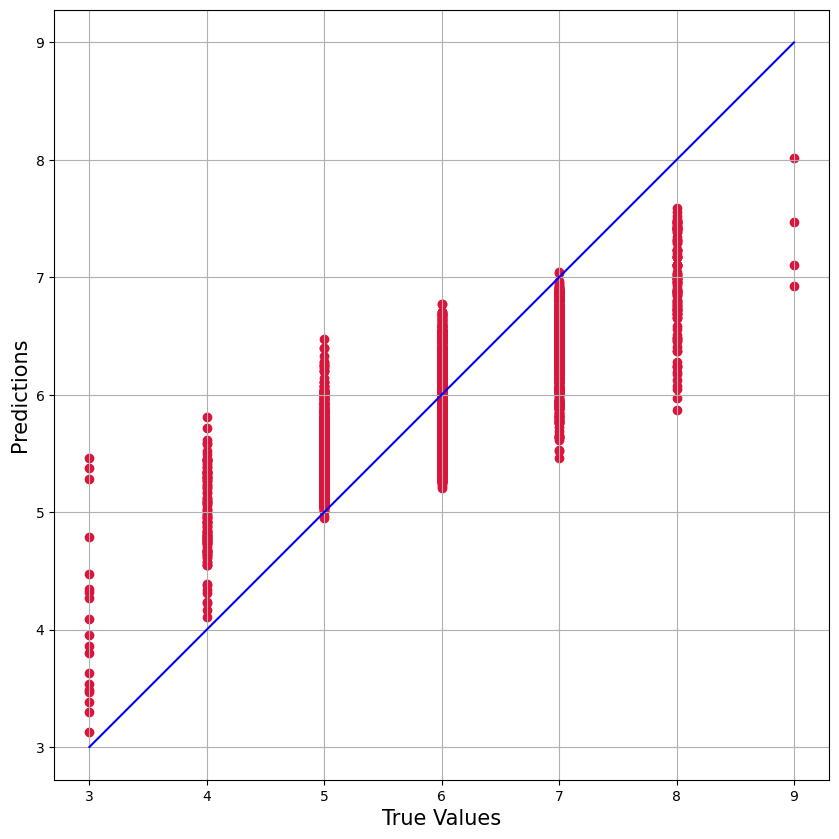


Test results
Rounded
 Accuracy of quality 3: 0.0%   |    5 data point
 Accuracy of quality 4: 9.09%   |    44 data point
 Accuracy of quality 5: 89.37%   |    442 data point
 Accuracy of quality 6: 41.02%   |    551 data point
 Accuracy of quality 7: 0.43%   |    232 data point
 Accuracy of quality 8: 0.0%   |    43 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    5 data point
 Accuracy of quality 4: 9.09%   |    44 data point
 Accuracy of quality 5: 91.18%   |    442 data point
 Accuracy of quality 6: 99.64%   |    551 data point
 Accuracy of quality 7: 81.03%   |    232 data point
 Accuracy of quality 8: 20.93%   |    43 data point


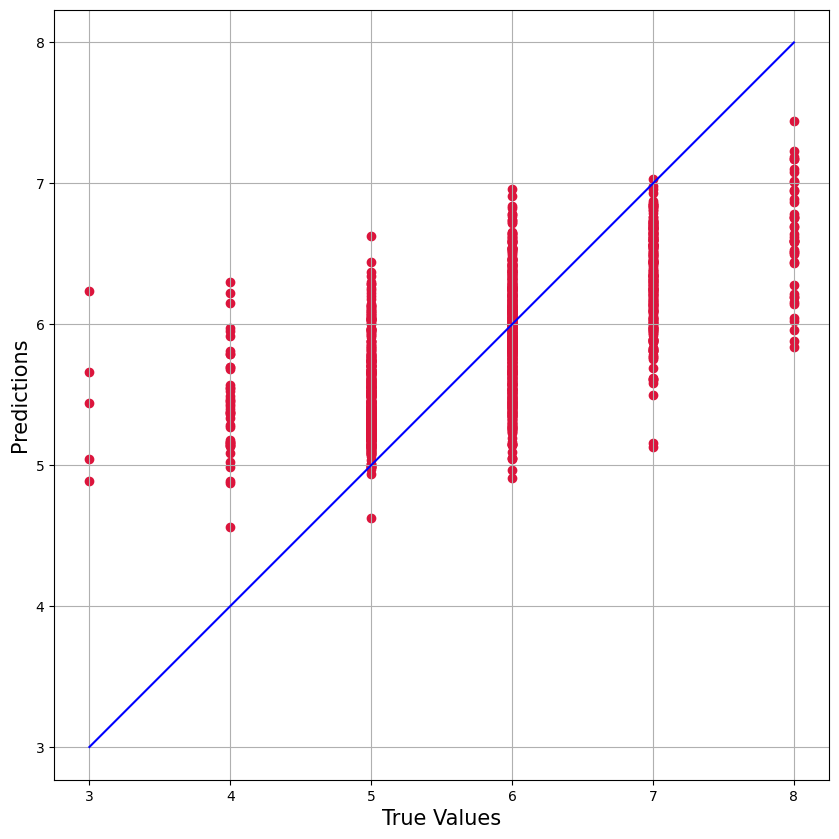

In [101]:
final_model_extra_trees = clf.best_estimator_
print(f"Best estimator: {final_model_extra_trees.get_params()}")
train_predictions = final_model_extra_trees.predict(X_train)
valid_predictions = final_model_extra_trees.predict(X_valid)

print_results(train_predictions, y_train, results_name="\nTraining Results of ExtraTreesRegressor", r2=True)
print_results(valid_predictions, y_valid, results_name="\nValidation Results of ExtraTreesRegressor", r2=True)

print_results_by_quality(train_predictions, y_train, "Train results")
print_results_by_quality(valid_predictions, y_valid, "\nTest results")

**Random Forest Regressor**

In [102]:
# parameters = {
#     'n_estimators': [50, 100, 200], 
#     'max_depth': [None, 10, 20]
# }

parameters = {
    'n_estimators': [100], 
    'max_depth': [None, 10, 20]
}

regressor = RandomForestRegressor(random_state=0)

clf_forest = GridSearchCV(regressor, parameters, verbose=3)
clf_forest.fit(X_train, y_train)
sorted(clf_forest.cv_results_.keys())

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END ..max_depth=None, n_estimators=100;, score=0.154 total time=   4.5s
[CV 2/5] END ..max_depth=None, n_estimators=100;, score=0.260 total time=   4.8s
[CV 3/5] END ..max_depth=None, n_estimators=100;, score=0.251 total time=   3.2s
[CV 4/5] END ..max_depth=None, n_estimators=100;, score=0.287 total time=   1.9s
[CV 5/5] END ..max_depth=None, n_estimators=100;, score=0.255 total time=   2.0s
[CV 1/5] END ....max_depth=10, n_estimators=100;, score=0.159 total time=   1.9s
[CV 2/5] END ....max_depth=10, n_estimators=100;, score=0.253 total time=   1.8s
[CV 3/5] END ....max_depth=10, n_estimators=100;, score=0.255 total time=   1.5s
[CV 4/5] END ....max_depth=10, n_estimators=100;, score=0.302 total time=   1.5s
[CV 5/5] END ....max_depth=10, n_estimators=100;, score=0.250 total time=   1.5s
[CV 1/5] END ....max_depth=20, n_estimators=100;, score=0.147 total time=   1.9s
[CV 2/5] END ....max_depth=20, n_estimators=100;,

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_max_depth',
 'param_n_estimators',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'split3_test_score',
 'split4_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

Best estimator: {'bootstrap': False, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}

Results of RandomForestRegressor
MAE: 0.4197942150461274
  Accuracy: 50.79%
  Accuracy +/- 1: 93.92%
  R2: 0.6338832942735583

Results of RandomForestRegressor
MAE: 0.5196893748008501
  Accuracy: 47.53%
  Accuracy +/- 1: 87.55%
  R2: 0.43420074902559236
Train results
Rounded
 Accuracy of quality 3: 52.63%   |    19 data point
 Accuracy of quality 4: 55.56%   |    117 data point
 Accuracy of quality 5: 96.91%   |    1263 data point
 Accuracy of quality 6: 39.65%   |    1735 data point
 Accuracy of quality 7: 0.3%   |    658 data point
 Accuracy of quality 8: 0.0%   |    120 data point
 Accuracy of qualit

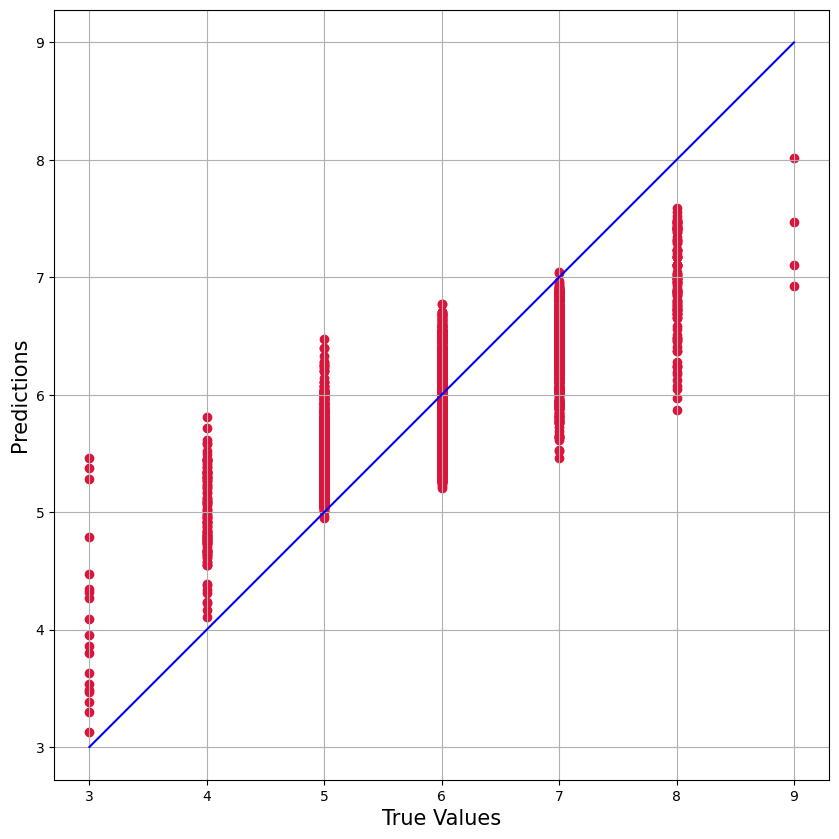


Test results
Rounded
 Accuracy of quality 3: 0.0%   |    5 data point
 Accuracy of quality 4: 9.09%   |    44 data point
 Accuracy of quality 5: 89.37%   |    442 data point
 Accuracy of quality 6: 41.02%   |    551 data point
 Accuracy of quality 7: 0.43%   |    232 data point
 Accuracy of quality 8: 0.0%   |    43 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    5 data point
 Accuracy of quality 4: 9.09%   |    44 data point
 Accuracy of quality 5: 91.18%   |    442 data point
 Accuracy of quality 6: 99.64%   |    551 data point
 Accuracy of quality 7: 81.03%   |    232 data point
 Accuracy of quality 8: 20.93%   |    43 data point


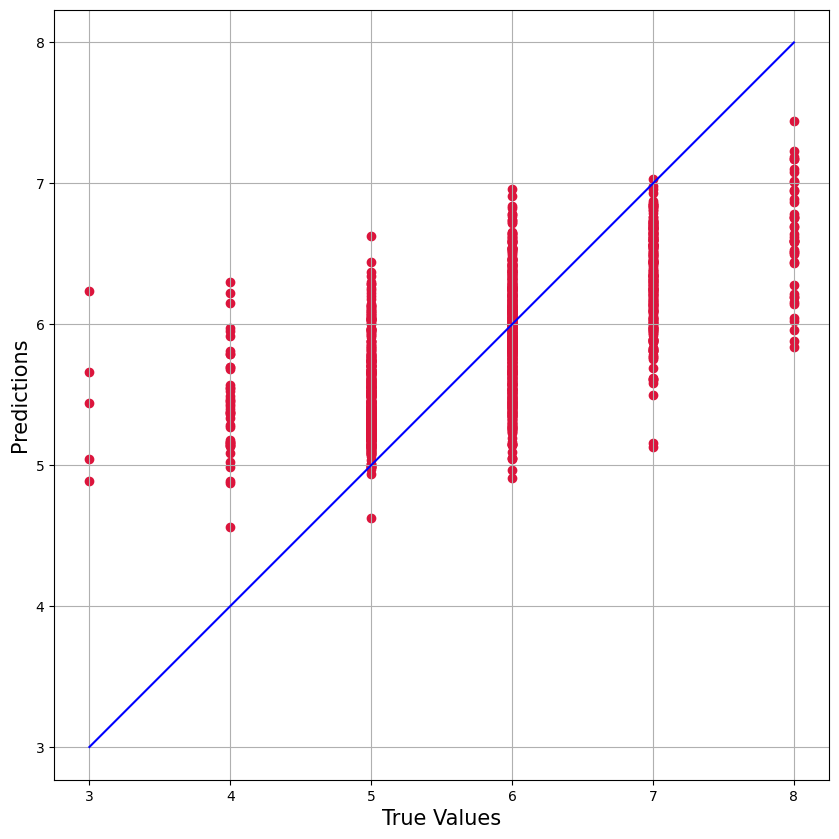

In [103]:
final_model_forest = clf.best_estimator_
print(f"Best estimator: {final_model_forest.get_params()}")
train_predictions = final_model_forest.predict(X_train)
valid_predictions = final_model_forest.predict(X_valid)

print_results(train_predictions, y_train, results_name="\nResults of RandomForestRegressor", r2=True)
print_results(valid_predictions, y_valid, results_name="\nResults of RandomForestRegressor", r2=True)

print_results_by_quality(train_predictions, y_train, "Train results")
print_results_by_quality(valid_predictions, y_valid, "\nTest results")

The two model give the same result on the valid set, let's use de random forest regressor as the final model

Test Results of RandomForestRegressor
MAE: 0.5231481055821535
  Accuracy: 47.71%
  Accuracy +/- 1: 88.61%
  R2: 0.3987705724102313

Test results
Rounded
 Accuracy of quality 3: 0.0%   |    6 data point
 Accuracy of quality 4: 23.64%   |    55 data point
 Accuracy of quality 5: 90.53%   |    433 data point
 Accuracy of quality 6: 35.82%   |    550 data point
 Accuracy of quality 7: 0.53%   |    189 data point
 Accuracy of quality 8: 0.0%   |    30 data point
 Accuracy of quality 9: 0.0%   |    1 data point
+/- 1
 Accuracy of quality 3: 0.0%   |    6 data point
 Accuracy of quality 4: 23.64%   |    55 data point
 Accuracy of quality 5: 91.45%   |    433 data point
 Accuracy of quality 6: 99.64%   |    550 data point
 Accuracy of quality 7: 83.07%   |    189 data point
 Accuracy of quality 8: 20.0%   |    30 data point
 Accuracy of quality 9: 0.0%   |    1 data point


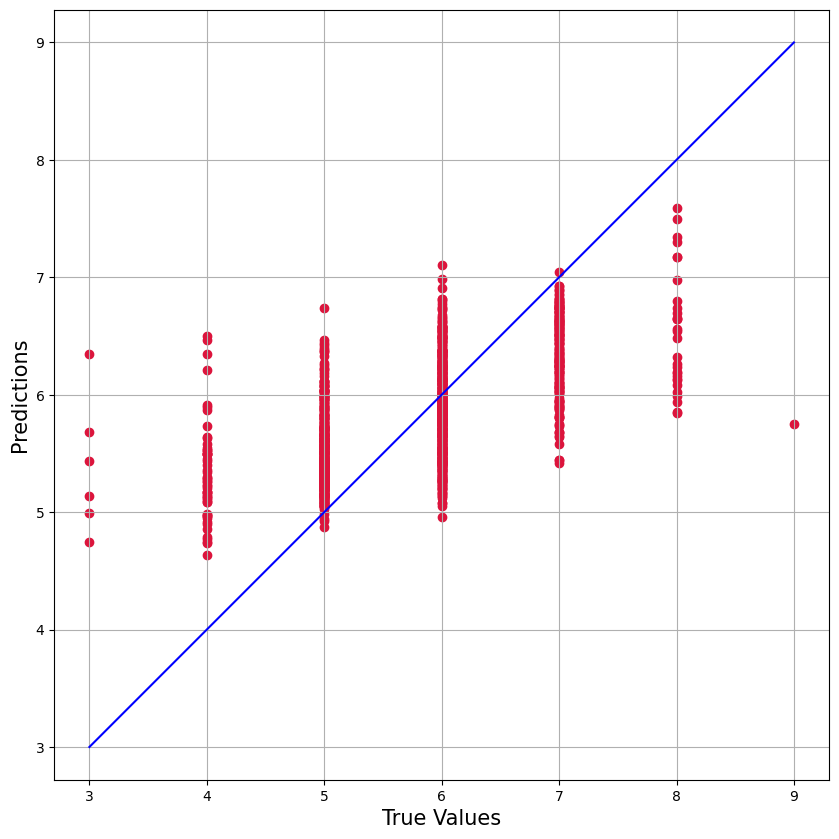

In [104]:
X_test, y_test = test[feature_colum_names], test[y_column_name]

y_test_pred = final_model_forest.predict(X_test)

print_results(y_test_pred, y_test, results_name="Test Results of RandomForestRegressor", r2=True)
print_results_by_quality(y_test_pred, y_test, "\nTest results")


In [105]:
red_pred = []
red_true = []
white_pred = []
white_true = []

for i in range(len(y_test_pred)):
    if test.iloc[i][' couleur'] == 'rouge':
        red_pred.append(y_test_pred[i])
        red_true.append(test.iloc[i]['Y_qualite'])
    else:
        white_pred.append(y_test_pred[i])
        white_true.append(test.iloc[i]['Y_qualite'])

print_results(red_pred, pd.DataFrame(red_true)[0], "\nTest results for red wine", False)
print(f"{len(red_pred)} red wine")
print_results(white_pred, pd.DataFrame(white_true)[0], "\nTest results for white wine", False)
print(f"{len(white_pred)} white wine")


Test results for red wine
MAE: 0.4791393406260836
  Accuracy: 51.92%
  Accuracy +/- 1: 91.03%
312 red wine

Test results for white wine
MAE: 0.5375711461980082
  Accuracy: 46.32%
  Accuracy +/- 1: 87.82%
952 white wine


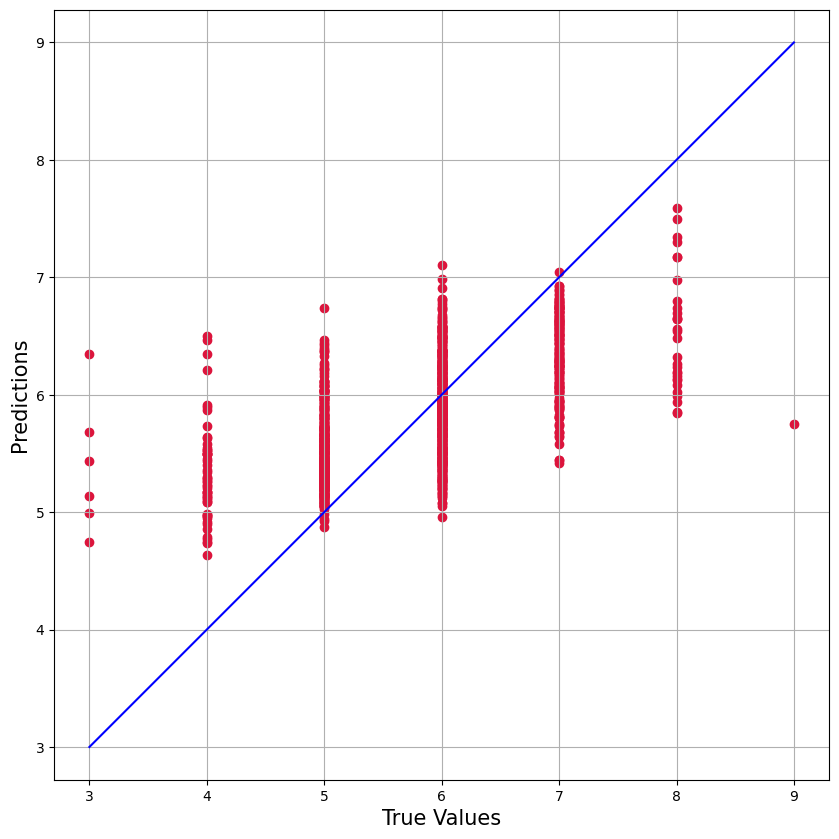

In [106]:
plt.figure(figsize=(10,10))
plt.scatter(y_test, y_test_pred, c='crimson')
p1 = max(max(y_test_pred), max(y_test))
p2 = min(min(y_test_pred), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.axis('equal')
plt.grid()
plt.show()


Le modèle final retenu est un modèle de régression par Random Forest. Ce choix a été fait après une comparaison de plusieurs modèles sur l'ensemble de validation.

Lorsque nous avons examiné les résultats de ce modèle sur l'ensemble de test, nous avons constaté qu'il offrait de meilleurs résultats que le modèle de régression précédemment développé. Notre modèle de Random Forest a en effet généré un MAE de 0,5231, avec une précision arrondie de 47% et une précision de +/- 88%. En observant plus attentivement les résultats, nous avons remarqué que le modèle donne de meilleurs résultats pour les vins rouges (MAE : 0,4791) que pour les vins blancs (0,5375). Il est toutefois important de souligner que l'ensemble de test comportait trois fois plus de vins blancs que de vins rouges. En outre, l'analyse des différentes classes de vins selon notre métrique de précision de +/- 1 a donné un score de 91,03% pour les vins rouges et de 87,82% pour les vins blancs.

Compte tenu de la nature subjective du classement en 10 classes, il est possible que la métrique de prédiction varie selon les différents juges. Cependant, nous pouvons conclure que le modèle développé offre d'excellents résultats.

---

The selected final model is a Random Forest regression model. The decision to use this model was made after comparing several models on the validation set.

When we examined the results of this model on the test set, we found that it offered better results than the previously developed regression model. Our Random Forest model generated an MAE of 0.5231, with a rounded precision of 47% and a precision of +/- 88%. Upon closer examination of the results, we noticed that the model performed better for red wines (MAE: 0.4791) than for white wines (0.5375). However, it is worth noting that the test set had three times as many white wines as red wines. Additionally, the analysis of the different wine classes according to our +/- 1 precision metric gave a score of 91.03% for red wines and 87.82% for white wines.

Given the subjective nature of the 10-class ranking metric, it is possible that the prediction metric may vary among different judges. However, we can conclude that the developed model offers excellent results.

In [ ]:
from sklearn.tree import export_graphviz
import pydotplus
import six
from sklearn import tree
import os

In [ ]:
dotfile = six.StringIO()
i_tree = 0

for tree_in_forest in final_model_forest.estimators_:
    if (i_tree <1):        
        tree.export_graphviz(tree_in_forest, out_file=dotfile)
        pydotplus.graph_from_dot_data(dotfile.getvalue()).write_png('dtree'+ str(i_tree) +'.png')
        i_tree = i_tree + 1

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.636339 to fit



In [ ]:
export_graphviz(tree_in_forest,
                feature_names=X_train.columns,
                filled=True,
                rounded=True)


In [ ]:
os.system('dot -Tpng tree.dot -o tree.png')

512

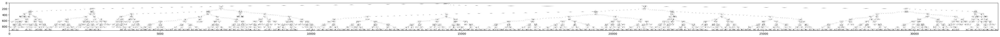

In [ ]:
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
 
image = mpimg.imread(f"{BASE_PATH}dtree0.png")

fig, ax = plt.subplots(figsize=(64, 24))
ax.imshow(image, interpolation='nearest')
plt.show()

Il est à souligner que pour obtenir un tel résultat, la complexité et l'explicabilité du modèle deviennent plus élevées. Le modèle, une forêt comprenant plus d'une centaine d'estimateurs est ainsi représenté à l'image précédente. Il est important de se demander si cette complexité en vaut la peine, notamment lorsqu'il s'agit d'expliquer le modèle à des viticulteurs et de leur fournir des conseils sur l'amélioration de leurs vins.

---

It should be noted that to achieve such a result, the complexity and explainability of the model increase. The model, a forest consisting of more than a hundred estimators, is shown in the previous image. It is important to question whether this complexity is worthwhile, especially when it comes to explaining the model to winemakers and providing them with advice on improving their wines.